# Análise de impacto de campanhas de marketing 

_por João Hiroyuki de Melo Inagaki_ 

Neste notebook de análise de dados e modelagem preditiva, abordaremos um problema crucial no mundo do marketing - a eficácia das campanhas de marketing. Exploraremos um conjunto de dados abrangente relacionado às campanhas de marketing anteriores de uma empresa e buscaremos insights valiosos para melhorar a estratégia de marketing futura.

**Objetivo do Projeto**

Uma empresa de varejo de alimentos bem estabelecida está enfrentando desafios em relação ao crescimento dos lucros. Eles atendem muitos clientes e vendem uma variedade de produtos por meio de diferentes canais. Para melhorar a situação, estão considerando iniciativas estratégicas, com destaque para o aprimoramento das atividades de marketing, incluindo campanhas de marketing.

O departamento de marketing está buscando uma abordagem mais quantitativa para tomar decisões e está contratando uma equipe de cientistas de dados para construir um modelo preditivo que apoie suas iniciativas de marketing direto e demonstre o valor dessa abordagem.

A equipe busca construir um modelo preditivo para otimizar a próxima campanha de marketing direto, que visa vender um novo gadget aos clientes. Eles conduziram uma campanha piloto, mas tiveram prejuízo. O objetivo é desenvolver um modelo que identifique os clientes mais propensos a comprar, tornando a campanha futura lucrativa, enquanto também compreende o perfil desses clientes.

**Detalhes do Projeto**

A base de dados foi composta por 2.240 clientes selecionados aleatoriamente, os quais foram abordados com a oferta do gadget. O custo total da campanha de amostragem totalizou \\$6.720, enquanto a receita gerada pelos clientes que aceitaram a oferta alcançou \\$3.674. Em termos globais, a campanha resultou em um déficit de \\$3.046. A taxa de sucesso da campanha foi de 15%.


**Etapas do Projeto**


1. **Pré-processamento**: Limpar dados, codificar variáveis categóricas e normalizar para modelagem.

2. **Análise Exploratória (EDA)**: Explorar dados, identificar tendências e insights sobre o comportamento dos clientes.

3. **Modelos Preditivos**: Utilizar técnicas de aprendizado de máquina para prever sucesso de campanhas; Medir desempenho com métricas e validação cruzada; Compreender fatores influentes nos resultados dos modelos.

4. **Recomendações**: Orientar estratégias de marketing com base nos insights.


**Origem dos Dados**

Os dados utilizados neste projeto foram retirados do Kaggle, de um conjunto de dados disponível em [https://www.kaggle.com/datasets/jackdaoud/marketing-data](https://www.kaggle.com/datasets/jackdaoud/marketing-data). 


Além dos dados, informações adicionais acerca do problema foram obtidas no repositório [https://github.com/nailson/ifood-data-business-analyst-test](https://github.com/nailson/ifood-data-business-analyst-test), o que nos permitirá uma análise mais completa e aprofundada.



# 1. Pré-processamento

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import ast
from itertools import product


from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score,StratifiedKFold, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
from sklearn.tree import plot_tree

/home/hiro/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.25.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Vamos carregar o dataset e fazer uma limpeza dos dados

In [2]:
# Importando os dados

df = pd.read_csv("ifood_df.csv")

In [3]:
# Visualizando os dados e cada uma das variáveis

pd.options.display.max_columns = None
df.head(10)


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Customer_Days,marital_Divorced,marital_Married,marital_Single,marital_Together,marital_Widow,education_2n Cycle,education_Basic,education_Graduation,education_Master,education_PhD,MntTotal,MntRegularProds,AcceptedCmpOverall
0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,63,2822,0,0,1,0,0,0,0,1,0,0,1529,1441,0
1,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,66,2272,0,0,1,0,0,0,0,1,0,0,21,15,0
2,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,55,2471,0,0,0,1,0,0,0,1,0,0,734,692,0
3,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,36,2298,0,0,0,1,0,0,0,1,0,0,48,43,0
4,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,39,2320,0,1,0,0,0,0,0,0,0,1,407,392,0
5,62513.0,0,1,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0,53,2452,0,0,0,1,0,0,0,0,1,0,702,688,0
6,55635.0,0,1,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0,49,2752,1,0,0,0,0,0,0,1,0,0,563,536,0
7,33454.0,1,0,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0,35,2576,0,1,0,0,0,0,0,0,0,1,146,123,0
8,30351.0,1,0,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1,46,2547,0,0,0,1,0,0,0,0,0,1,44,42,0
9,5648.0,1,1,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,3,11,0,70,2267,0,0,0,1,0,0,0,0,0,1,36,23,1


In [4]:
# Informação do dataframe

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205 entries, 0 to 2204
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Income                2205 non-null   float64
 1   Kidhome               2205 non-null   int64  
 2   Teenhome              2205 non-null   int64  
 3   Recency               2205 non-null   int64  
 4   MntWines              2205 non-null   int64  
 5   MntFruits             2205 non-null   int64  
 6   MntMeatProducts       2205 non-null   int64  
 7   MntFishProducts       2205 non-null   int64  
 8   MntSweetProducts      2205 non-null   int64  
 9   MntGoldProds          2205 non-null   int64  
 10  NumDealsPurchases     2205 non-null   int64  
 11  NumWebPurchases       2205 non-null   int64  
 12  NumCatalogPurchases   2205 non-null   int64  
 13  NumStorePurchases     2205 non-null   int64  
 14  NumWebVisitsMonth     2205 non-null   int64  
 15  AcceptedCmp3         

Vamos olhar para a definição das variáveis.

| Variável                | Descrição                                   |
|-------------------------|-----------------------------------------------|
| `Income`                | Renda anual da família do cliente           |
| `Kidhome`               | Número de crianças pequenas na família do cliente |
| `Teenhome`              | Número de adolescentes na família do cliente  |
| `Recency`               | Número de dias desde a última compra       |
| `MntWines`              | Valor gasto em vinhos nos últimos 2 anos    |
| `MntFruits`             | Valor gasto em frutas nos últimos 2 anos   |
| `MntMeatProducts`       | Valor gasto em produtos de carne nos últimos 2 anos |
| `MntFishProducts`       | Valor gasto em produtos de peixe nos últimos 2 anos |
| `MntSweetProducts`      | Valor gasto em produtos doces nos últimos 2 anos |
| `MntGoldProds`          | Valor gasto em produtos de ouro nos últimos 2 anos |
| `NumDealsPurchases`     | Número de compras feitas com desconto       |
| `NumWebPurchases`       | Número de compras feitas pelo site da empresa |
| `NumCatalogPurchases`   | Número de compras feitas usando catálogo    |
| `NumStorePurchases`     | Número de compras feitas diretamente nas lojas  |
| `NumWebVisitsMonth`     | Número de visitas ao site da empresa no último mês |
| `AcceptedCmp3`          | 1 se o cliente aceitou a oferta na 3ª campanha, 0 caso contrário |
| `AcceptedCmp4`          | 1 se o cliente aceitou a oferta na 4ª campanha, 0 caso contrário |
| `AcceptedCmp5`          | 1 se o cliente aceitou a oferta na 5ª campanha, 0 caso contrário |
| `AcceptedCmp1`          | 1 se o cliente aceitou a oferta na 1ª campanha, 0 caso contrário |
| `AcceptedCmp2`          | 1 se o cliente aceitou a oferta na 2ª campanha, 0 caso contrário |
| `Complain`              | 1 se o cliente reclamou nos últimos 2 anos |
| `Z_CostContact`         | ????                                         |
| `Z_Revenue`             | ????                                         |
| `Response (Alvo)`       | 1 se o cliente aceitou a oferta na última campanha, 0 caso contrário |
| `Age`                   | Idade do cliente                               |
| `Customer_Days`         | Dias desde a inscrição do cliente                                         |
| `marital_Divorced`      | Estado civil do cliente é divorciado      |
| `marital_Married`       | Estado civil do cliente é casado       |
| `marital_Single`        | Estado civil do cliente é solteiro        |
| `marital_Together`      | Estado civil do cliente é junto      |
| `marital_Widow`         | Estado civil do cliente é viúvo         |
| `education_2n Cycle`    | Nível de educação do cliente é ciclo 2    |
| `education_Basic`       | Nível de educação do cliente é básico         |
| `education_Graduation`  | Nível de educação do cliente é graduação    |
| `education_Master`      | Nível de educação do cliente é mestrado        |
| `education_PhD`         | Nível de educação do cliente é PhD           |
| `MntTotal`              | Valor total gasto nos últimos 2 anos     |
| `MntRegularProds`       | Valor gasto em produtos regulares nos últimos 2 anos |
| `AcceptedCmpOverall`    | Soma de AcceptedCmp                           |



Podemos tirar algumas informações acerca das variáveis 
1. Produtos podem ser categorizados em "tipos" e "selos". Os tipos são
- Vinhos (`MntWines`)
- Frutas (`MntFruits`)
- Carnes (`MntFishProducts`)
- Peixes (`MntMeatProducts`)
- Doces (`MntSweetProducts`)

    e os selos são
- Regular (`MntRegularProds`)
- Gold (`MntGoldProds`)

    desta forma, a variável `MntTotal` é a soma de `MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts` e `MntSweetProducts` OU a soma de `MntRegularProds` e `MntGoldProds`. Isso pode ser mostrado via código

``` python
np.where(df[['MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts']].sum(axis=1)== df['MntTotal'], 0, 1).sum()
## 0
```
``` python
np.where(df[['MntRegularProds', 'MntGoldProds']].sum(axis=1)== df['MntTotal'], 0, 1).sum()
## 0
```

2. Cliente pode adquirir produtos via
- Lojas físicas (`NumStorePurchases`)
- Catálogo (`NumCatalogPurchases`)
- Website (`NumWebPurchases`)


3. Não foi possível encontrar informações acerca das variáveis `Z_CostContact` e `Z_Revenue`, mas é possível mostrar que o primeiro tem todos os valores iguais a 3 e o segundo iguais a 11, como pode ser visto abaixo. Não utilizaremos estes dados na nossa análise.
``` python
np.where(df['Z_CostContact']== 3, 0, 1).sum()
## 0
```
``` python
np.where(df['Z_Revenue']== 11, 0, 1).sum()
## 0
```

4. Não há missing values
``` python
df.isnull().sum().sum()
## 0
```

5. Há observações duplicadas
``` python
len(df[df.duplicated()])
## 184
```

6. A categoria "2n Cycle" muito provavelmente se refere ao segundo ciclo do sistema de três ciclos em que os paises que compõem o [Espaço Europeu de Ensino Superior (EEES)](https://www.ehea.info/page-three-cycle-system) adotam. Este segundo ciclo seria equivalente a um mestrado. Como não temos informação acerca de que paises esses dados são e como não encontramos mais informações acerca da categoria em questão, iremos tratá-lo como mestrado.



7. As variáveis de estado civil e educação são categorias dummyzadas. Vamos criar variáveis categóricas `MaritalStatus` e `EducationStatus`.

8. Outra forma de analisar o estado civil seria agregar estas categorias de estado civil em apenas duas: "Single" e "Couple". Vamos criar a variável `Alone_or_Couple`.

9. Em geral, crianças e adolescentes são dependentes da renda dos pais. Vamos criar uma variável `Dependents` sendo a soma de `Kidhome` com `Teenhome`.

10. Algumas variáveis numéricas podem ser categorizadas para que se facilite a análise. Faremos isso com `Income`, `Age`, `Recency` e `Customer_Days` criando variáveis com o sufixo `Group`. 



Partimos para algumas transformações no dataset original

1. Mudar o tipo de algumas variáveis para categóricas.

In [5]:
cols_to_convert = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
                   'AcceptedCmp2', 'Complain', 'Response', 'marital_Divorced', 'marital_Married',
                   'marital_Single', 'marital_Together', 'marital_Widow',  'education_2n Cycle', 
                   'education_Basic', 'education_Graduation',
                   'education_Master', 'education_PhD']

df[cols_to_convert] = df[cols_to_convert].astype('category')

2. Excluir as variáveis `Z_CostContact` e `Z_Revenue`

In [6]:
df = df.drop(['Z_Revenue', 'Z_CostContact'], axis = 1)

3. Excluir observações duplicadas

In [7]:
df = df.drop_duplicates(keep = 'first', ignore_index = True)

4. Merge de  `education_2n Cycle` com `education_Master` e excluir `education_2n Cycle`

In [8]:
df['education_Master'] = (df['education_2n Cycle'].astype('int') | df['education_Master'].astype('int')).astype('category')
df = df.drop(['education_2n Cycle'], axis = 1)

4. Criar variáveis `MaritalStatus`, `EducationStatus`, `Dependents` e `Alone_or_Couple`.

In [9]:

df['MaritalStatus'] = df[['marital_Divorced', 'marital_Married',
                   'marital_Single', 'marital_Together', 'marital_Widow']].idxmax(axis=1).str.split('_').str[1]

#----------------------------------------------------------------------------------------------------------------

df['EducationStatus'] = df[['education_Basic', 'education_Graduation',
                   'education_Master', 'education_PhD']].idxmax(axis=1).str.split('_').str[1]

#----------------------------------------------------------------------------------------------------------------

df['Dependents'] = df['Kidhome'] + df['Teenhome']

#----------------------------------------------------------------------------------------------------------------

df['Alone_or_Couple'] = np.where(df['MaritalStatus'].isin(['Single', 'Divorced', 'Widow']), 'Alone', 'Couple')




5. Criar variáveis `AgeGroup`, `IncomeGroup`, `RecencyGroup` e `Customer_DaysGroup`

In [10]:
limits_age = [24, 30, 35, 40, 45, 50, 55,  60, 65, 70, 75, 81]
labels_age = ['24-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64',  '65-69', '70-74', '75-81']
df['AgeGroup'] = pd.cut(df['Age'], bins=limits_age, labels=labels_age)

#----------------------------------------------------------------------------------------------------------------

limits_recency = [ 0,  7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77, 84, 91, 98, float("inf")]
labels_recency = ['0-6', '7-13', '14-20', '21-27', '28-34', '35-41', '42-48', '49-55', '56-62', '63-69', '70-76', '77-83', '84-90', '91-97', '+98']
df['RecencyGroup'] = pd.cut(df['Recency'], bins=limits_recency, labels=labels_recency)

#----------------------------------------------------------------------------------------------------------------

limits_income = [     0,   5000,  10000,  15000,  20000,  25000,  30000,
        35000,  40000,  45000,  50000,  55000,  60000,  65000,
        70000,  75000,  80000,  85000, 90000,  95000, 100000,
       105000, 110000, float("inf")]
labels_income = ['0-5k', '5-10k', '10-15k', '15-20k', '20-25k', '25-30k', '30-35k',
       '35-40k', '40-45k', '45-50k', '50-55k', '55-60k', '60-65k',
       '65-70k', '70-75k', '75-80k', '80-85k', '85-90k', '90-95k',
       '95-100k', '100-105k', '105-110k', '+110k']
df['IncomeGroup'] = pd.cut(df['Income'], bins=limits_income, labels=labels_income)

#----------------------------------------------------------------------------------------------------------------

limits_customerdays = [2159, 2189, 2219, 2249, 2279, 2309, 2339, 2369, 2399, 2429, 2459,
       2489, 2519, 2549, 2579, 2609, 2639, 2669, 2699, 2729, 2759, 2789,
       2819, 2849, float("inf")]
labels_customerdays = ['2159-2188', '2189-2218', '2219-2248', '2249-2278', '2279-2308',
       '2309-2338', '2339-2368', '2369-2398', '2399-2428', '2429-2458',
       '2459-2488', '2489-2518', '2519-2548', '2549-2578', '2579-2608',
       '2609-2638', '2639-2668', '2669-2698', '2699-2728', '2729-2758',
       '2759-2788', '2789-2818', '2819-2848', '+2849']
df['Customer_DaysGroup'] = pd.cut(df['Customer_Days'], bins=limits_customerdays, labels=labels_customerdays)

# 2. Análise exploratória (EDA)

## 2.1. Análise univariada

Nesta seção, estamos conduzindo uma análise univariada, que consiste em examinar cada variável individualmente. Esse é o primeiro passo essencial para compreender os dados e obter informações iniciais a partir deles. Durante essa análise, concentramos nossa atenção na distribuição das variáveis e na obtenção de medidas estatísticas relevantes, utilizando uma variedade de técnicas de visualização de dados.

### Resumo estatístico

Vamos observar quantidades estatísticas para variáveis numéricas.

In [11]:
df.describe()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Age,Customer_Days,MntTotal,MntRegularProds,AcceptedCmpOverall,Dependents
count,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000,2021.000000
mean,51687.258783,0.443345,0.509649,48.880752,306.492331,26.364671,166.059871,37.603662,27.268679,43.921821,2.330035,4.115289,2.644730,5.807521,5.340426,51.117269,2511.613063,563.789213,519.867392,0.302326,0.952994
std,20713.046401,0.536196,0.546393,28.950917,337.603877,39.776518,219.869126,54.892196,41.575454,51.678211,1.892778,2.753588,2.799126,3.230434,2.426319,11.667616,202.546762,576.775749,554.797857,0.680812,0.746123
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,2159.000000,4.000000,-283.000000,0.000000,0.000000
25%,35416.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,43.000000,2337.000000,55.000000,42.000000,0.000000,0.000000
50%,51412.000000,0.000000,0.000000,49.000000,178.000000,8.000000,68.000000,12.000000,8.000000,25.000000,2.000000,4.000000,2.000000,5.000000,6.000000,50.000000,2511.000000,343.000000,288.000000,0.000000,1.000000
75%,68274.000000,1.000000,1.000000,74.000000,507.000000,33.000000,230.000000,50.000000,34.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,61.000000,2688.000000,964.000000,883.000000,0.000000,1.000000
max,113734.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,15.000000,27.000000,28.000000,13.000000,20.000000,80.000000,2858.000000,2491.000000,2458.000000,4.000000,3.000000


Note que a coluna `MntRegularProds` possui um valor mínimo negativo, sendo indicativo de erro de entrada destes dados. Uma vez que não possível que haja um gasto negativo em um produto, iremos identificar e excluir as observações que contém valores negativos para esta variável. Identificamos quais observações são pelo código abaixo
``` python
np.where(df['MntRegularProds'] < 0)[0]
## array([1248, 1649, 1800])
```

Como são apenas 3 observações, podemos excluir sem prejuízo a nossa análise

In [12]:
df = df.drop(np.where(df['MntRegularProds'] < 0)[0])
df = df.reset_index(drop=True)

### Detecção de outliers (boxplot)

O boxplot é uma ferramenta gráfica que nos ajuda a visualizar várias medidas estatísticas de forma eficaz. Ele apresenta informações importantes sobre a distribuição de dados de uma maneira concisa. Vamos entender as principais partes de um boxplot:

- A linha horizontal sólida no meio da caixa é a mediana dos dados, que é o valor que divide o conjunto de dados ao meio, indicando onde está o ponto central da distribuição.

- A linha tracejada próxima à mediana é a média dos dados, que representa o valor médio de todas as observações.

- A caixa em si representa o intervalo interquartil (IQR), que é a diferença entre o terceiro quartil (limite superior da caixa) e o primeiro quartil (limite inferior da caixa). Essa caixa contém 50% dos dados, indicando a dispersão central dos valores.

- As barras que se estendem para fora da caixa são chamadas de "whiskers" e mostram a extensão da distribuição dos dados. Elas se estendem até o limite superior e inferior, excluindo os outliers.

- Os pontos fora das barras são chamados de outliers, que são valores atípicos que estão significativamente distantes dos valores centrais da distribuição. Esses pontos podem representar observações incomuns ou erros de medição.

É importante notar que, embora nossas variáveis possuam outliers, não iremos descartar essas observações, pois não há indicação de que sejam erros de entrada. Em vez disso, iremos considerar esses valores na nossa análise estatística, pois podem fornecer informações valiosas sobre a distribuição dos dados e possíveis insights.

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---


- Destaca-se produtos de vinho e carne como produtos onde há o maior gasto.

- Vende-se mais em lojas físicas, seguido de web e por fim em catálogos.

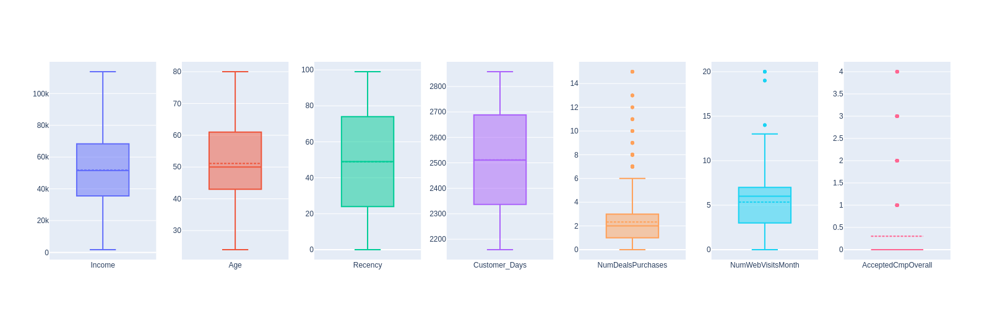

In [13]:

df_plot = df[['Income',  'Age', 'Recency', 'Customer_Days','NumDealsPurchases', 'NumWebVisitsMonth', 'AcceptedCmpOverall',]]



rows = 1
cols = 7
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==len(df_plot.columns):
            break
        
        fig.add_trace(
        go.Box(y=df_plot[df_plot.columns[k]],
               name=df_plot.columns[k],
               boxmean=True
              ),
        row=(i+1), col=(j+1)
        )
        k = k + 1

fig.update_layout(
    showlegend = False,
    width=1000,
        height=500,
)


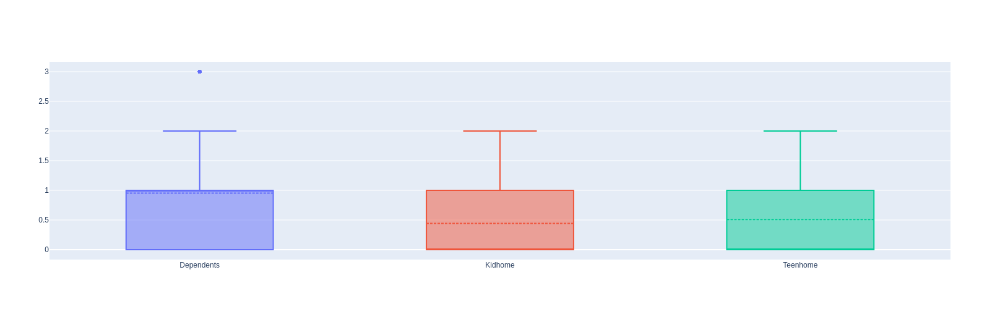

In [14]:
df_plot = df[['Dependents', 'Kidhome', 'Teenhome', ]]

rows = 1
cols = 1
fig = make_subplots(rows=rows, cols=cols)

for i in range(len(df_plot.columns)):
    fig.add_trace(
        go.Box(y=df_plot[df_plot.columns[i]],
               name=df_plot.columns[i],
               boxmean=True
              ),
        row=(1), col=(1)
        )
    

fig.update_layout(
    showlegend = False,
    width=1000,
        height=500,
)


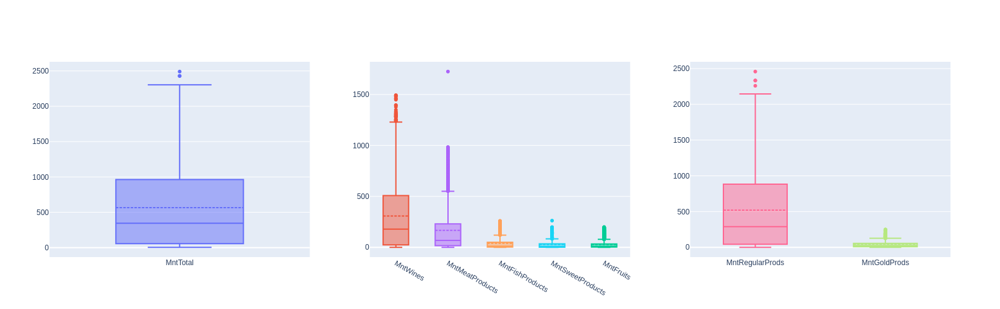

In [15]:
rows = 1
cols = 3
fig = make_subplots(rows=rows, cols=cols)


df_plot = df[[
    'MntTotal',
]]



for i in range(len(df_plot.columns)):
    fig.add_trace(
        go.Box(y=df_plot[df_plot.columns[i]],
               name=df_plot.columns[i],
               boxmean=True
              ),
        row=(1), col=(1)
        )

fig.update_xaxes( row=(1), col=(1))

df_plot = df[[
    'MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
]]


index_sort = np.array(df_plot[['MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts']].mean().sort_values(ascending=False).index)


for i in range(len(df_plot.columns)):
    fig.add_trace(
        go.Box(y=df_plot[df_plot.columns[i]],
               name=df_plot.columns[i],
               boxmean=True
              ),
        row=(1), col=(2)
        )

fig.update_xaxes( row=(1), col=(2), categoryorder='array', categoryarray= index_sort)

df_plot = df[[
    'MntRegularProds', 'MntGoldProds',
]]

index_sort = np.array(df_plot[['MntRegularProds', 'MntGoldProds',]].mean().sort_values(ascending=False).index)


for i in range(len(df_plot.columns)):
    fig.add_trace(
        go.Box(y=df_plot[df_plot.columns[i]],
               name=df_plot.columns[i],
               boxmean=True
              ),
        row=(1), col=(3)
        )

fig.update_xaxes( row=(1), col=(3), categoryorder='array', categoryarray= index_sort)


fig.update_layout(
    showlegend = False,
    width=1000,
        height=500,
)


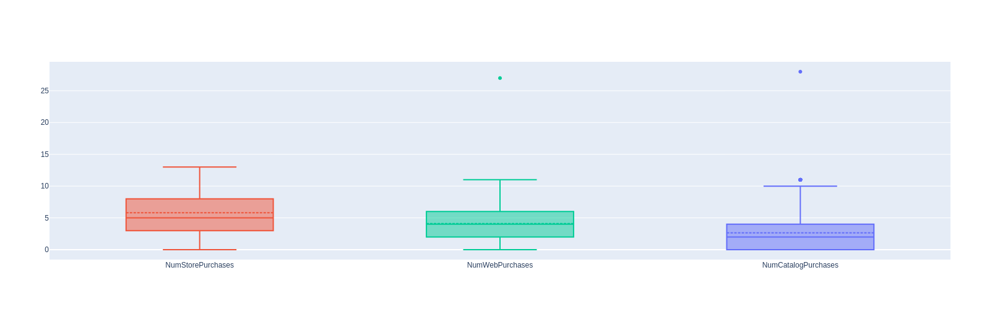

In [16]:
df_plot = df[['NumCatalogPurchases', 'NumStorePurchases',   'NumWebPurchases', ]]

rows = 1
cols = 1
fig = make_subplots(rows=rows, cols=cols)


index_sort = np.array(df_plot[['NumCatalogPurchases', 'NumStorePurchases',   'NumWebPurchases',]].mean().sort_values(ascending=False).index)

for i in range(len(df_plot.columns)):
    fig.add_trace(
        go.Box(y=df_plot[df_plot.columns[i]],
               name=df_plot.columns[i],
               boxmean=True
              ),
        row=(1), col=(1)
        )
    
fig.update_xaxes( row=(1), col=(1), categoryorder='array', categoryarray= index_sort)

fig.update_layout(
    showlegend = False,
    width=1000,
        height=500,
)


### Histograma das variáveis

Para as variáveis categóricas e numéricas, uma ferramenta valiosa de visualização é o histograma. Os histogramas nos permitem obter insights detalhados sobre a distribuição e a frequência dos valores em nossos dados.

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

<div style="font-size: 18px; font-weight: bold;">Demografia</div>

- **Renda**: A renda é um fator importante para análise de mercado. Observou-se que a distribuição possui perfil aproximadamente normal centrado na média. Dessa forma, a maioria das pessoas possui uma renda que varia de \\$3000 a \\$7000.
  
- **Idade**: Assim como a renda, a distribuição é aproximadamente normal. A maioria das pessoas tem idade que varia de 40 a 60 anos.
    
- **Educação**: A maioria dos consumidores possui educação superior (graduação, mestrado e doutorado). O número de consumidores apenas com ensino básico é baixo.
  
- **Estado Civil**: O estado civil mais comum entre os consumidores é casado, seguido por "juntos" e solteiro. Há mais consumidores em relacionamentos do que solteiros.
  
- **Dependentes**: É prevalente entre os consumidores a presença de dependentes, sejam crianças ou adolescentes. Podemos analisar analisar a influência desses grupos separadamente.

**<u>Pergunta:</u>** Como o comportamento do consumidor muda com a demografia?

---

<div style="font-size: 18px; font-weight: bold;">Comportamento do Consumidor</div>

- **Dias desde a última compra**: Os consumidores têm um comportamento homogêneo em relação a esse fator.
  
- **Promoções**: Observou-se um comportamento exponencial em relação às promoções. Muitos clientes aproveitam apenas uma promoção, mas não aceitam outras.
  
- **Dias como cliente**: Os consumidores têm um comportamento homogêneo em relação a esse fator.
  
- **Reclamações**: A grande maioria dos clientes não reclamou nos últimos dois anos, o que sugere que podemos ignorar essa variável em nossas análises.
  
- **Local de compra**: Há uma tendência de fazer mais compras via web e em lojas físicas. A quantidade de consumidores que nunca compraram via catálogo é muito alta (519).    
  
- **Sucesso de campanhas**: A campanha piloto teve um sucesso maior do que as outras, indicando uma mudança qualitativa nesta campanha em relação às demais. Um gráfico com a taxa de sucesso das campanhas mostra que as campanhas 1, 3, 4 e 5 têm resultados similares, enquanto a campanha 2 teve um sucesso muito menor, sugerindo uma mudança de estratégia de marketing.

**<u>Pergunta:</u>** Como se relaciona as vendas na web com o número de visitas na página da web?


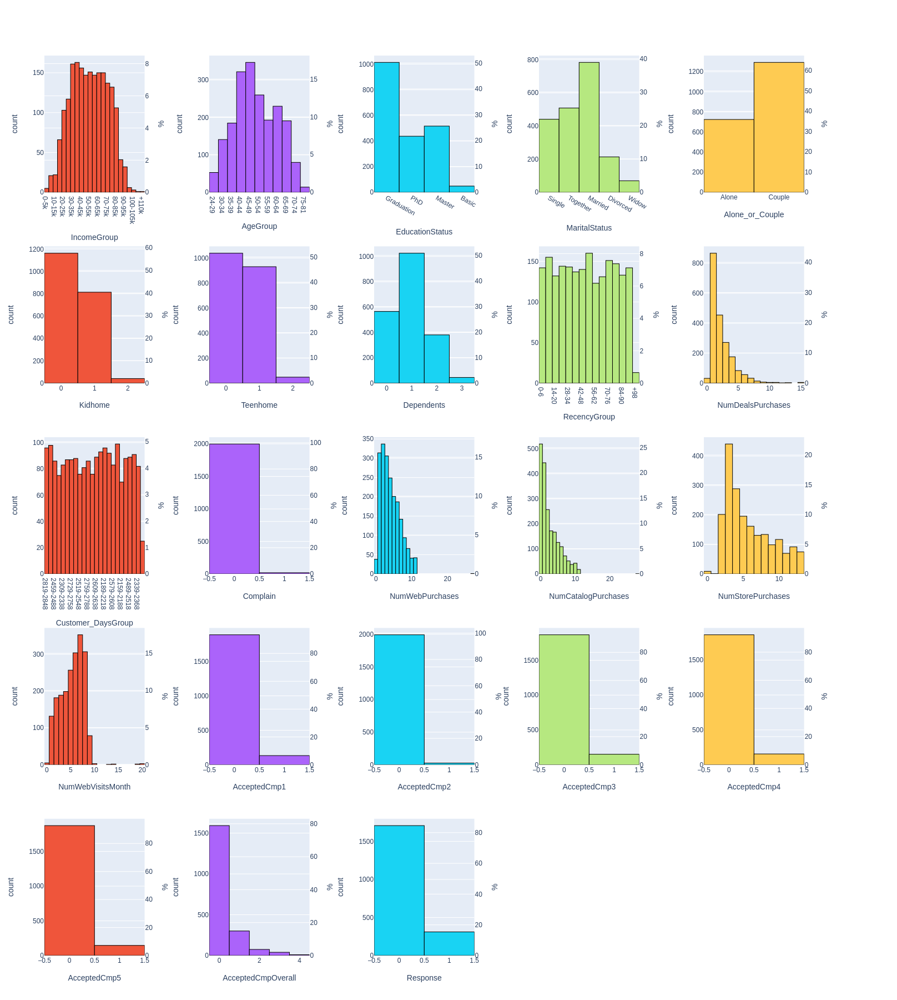

In [17]:
df_plot = df[['IncomeGroup', 'AgeGroup', 'EducationStatus', 'MaritalStatus', 'Alone_or_Couple',
              'Kidhome', 'Teenhome', 'Dependents', 'RecencyGroup', 'NumDealsPurchases',
              'Customer_DaysGroup', 'Complain', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
              'NumWebVisitsMonth', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3','AcceptedCmp4', 'AcceptedCmp5',
              'AcceptedCmpOverall', 'Response']]



col_names = df_plot.columns
rows = 5
cols = 5
fig = make_subplots(rows=rows,
                    cols=cols,
                    specs=[[{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }]])

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names)):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')
          
        
        fig.add_trace(
            go.Histogram(
                x=df_plot[Var],
                name=col_names[k],
                histnorm = 'percent',
                hoverinfo = 'none',
                opacity = 0,
                showlegend = False
            ), row=(i+1), col=(j+1),
            secondary_y = True,
        )
        
            
        fig.add_trace(
            go.Histogram(
                x=df_plot[Var],
                name=col_names[k],
                marker_line=dict(width=1, color='black'),
            ), row=(i+1), col=(j+1)
        )
        
        
        
        if Var=='AgeGroup':
            fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1), categoryorder='array', categoryarray= labels_age)
        elif Var=='RecencyGroup':
            fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1), categoryorder='array', categoryarray= labels_recency)
        elif Var=='IncomeGroup':
            fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1), categoryorder='array', categoryarray= labels_income)
        else:
            fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1))
            
        fig.update_yaxes(title_text='count', row=(i+1), col=(j+1), secondary_y = False)
        fig.update_yaxes(title_text='%', row=(i+1), col=(j+1), secondary_y = True)
        k = k +1

fig.update_layout(
    showlegend = False,
    width=1500,
    height=1800,
    barmode = 'overlay',
)

fig.show()

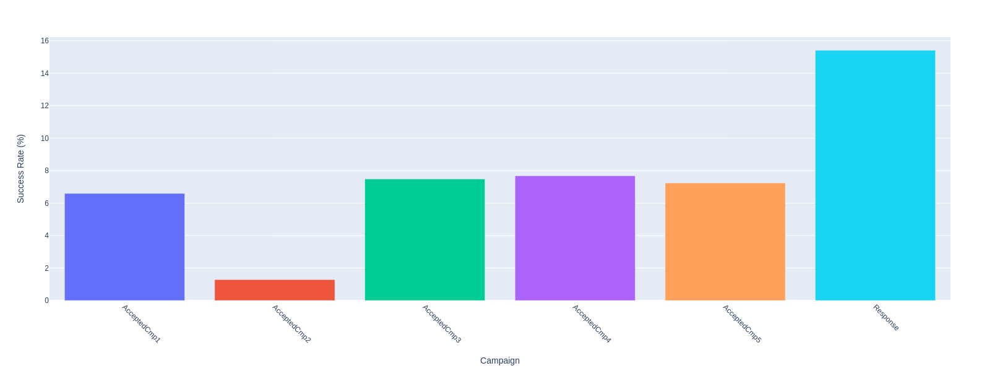

In [18]:
AcceptedCmp = df[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']].astype('int')
SuccessRateAcceptedCmp = AcceptedCmp.sum(axis = 0)/len(AcceptedCmp) 
SuccessRateAcceptedCmp = pd.DataFrame(SuccessRateAcceptedCmp,  columns = ['SuccessRate'])

fig = px.bar(SuccessRateAcceptedCmp*100, y='SuccessRate', color = SuccessRateAcceptedCmp.index, color_discrete_sequence=px.colors.qualitative.Plotly)

fig.update_layout(
    showlegend = False,
    xaxis_title='Campaign',
    yaxis_title='Success Rate (%)',
    xaxis=dict(tickangle=45),
    width=800,
    height=600,
)


### Receptividade da campanha por variável

Vamos analisar como cada uma das variáveis do histograma acima se comportam selecionando os clientes que responderam positivamente a última campanha.

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---


<div style="font-size: 18px; font-weight: bold;">Demografia</div>

- **Renda**: O pico da distribuição se deslocou para a direita, indicando que clientes com maior renda tendem a aceitar a campanha.

- **Idade**: Apesar da distribuição não ter se alterado muito, podemos ver que a faixa de idade mais responsiva é a de 45 a 49 anos, sendo responsável por quase 20% das respostas positivas.

- **Educação**: Aqueles com nível de graduação têm melhor resposta, reflexo da demografia da amostragem. Aqueles com nível de mestrado respondem levemente compõempior que os com nível de doutorado.

- **Estado Civil**: Solteiros e casados têm a melhor resposta, mas isso fica equiparado quando se analisa entre pessoas sozinhas e casais.

- **Dependentes**: Pessoas sem filhos respondem melhor à campanha.

---

<div style="font-size: 18px; font-weight: bold;">Comportamento do Consumidor</div>

- **Dias desde a Última Compra**: Quanto mais recente for a última compra, melhor será a responsividade do cliente.

- **Promoções**: Os clientes que compraram uma promoção prevalecem, mas este comportamento parece ser reflexo do comportamento exponencial do gráfico anterior.

- **Dias como Cliente**: Clientes mais antigos tendem a ser mais responsivos.

- **Local de Compra**: Apesar das compras via catálogo não possuírem tanta adesão, temos um número considerável de clientes que já compraram via catálogo e responderam bem à campanha, indicando um comportamento mais responsivo desses clientes.

- **Sucesso das Campanhas Anteriores**: Há uma tendência de clientes que aceitaram campanhas anteriores de aceitar a nova.


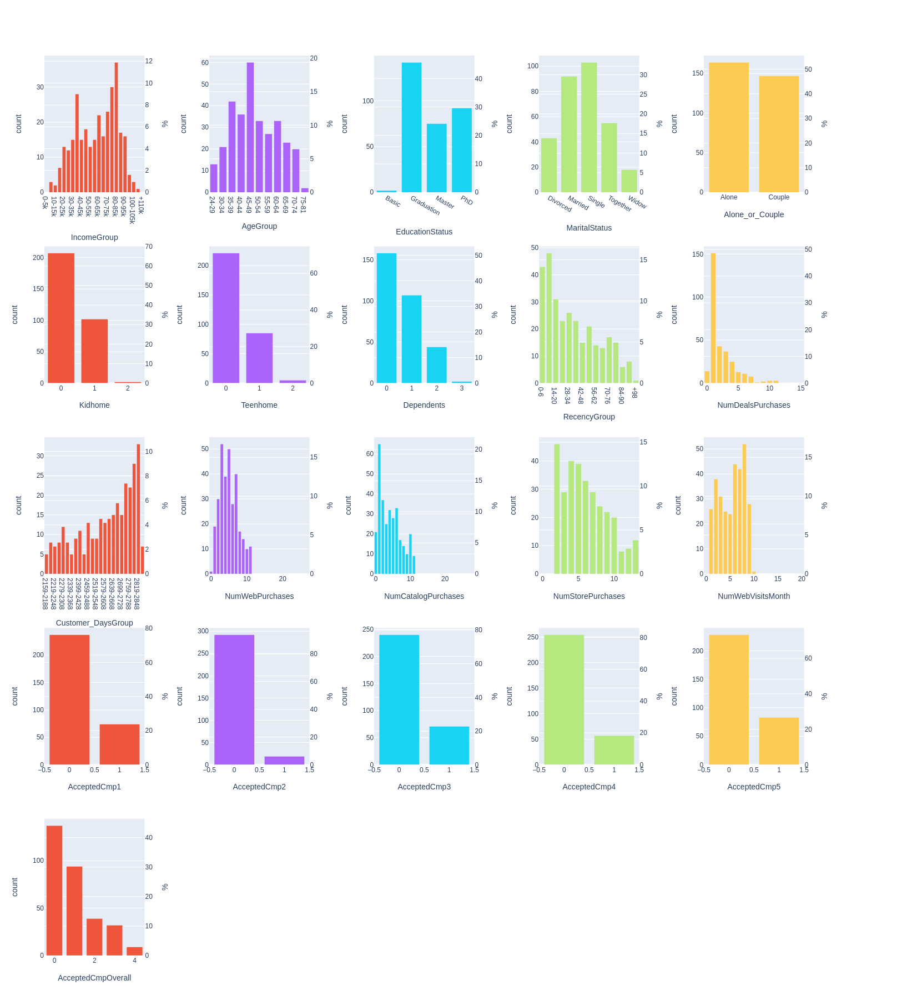

In [19]:
df_plot = df[['IncomeGroup', 'AgeGroup', 'EducationStatus', 'MaritalStatus', 'Alone_or_Couple',
              'Kidhome', 'Teenhome', 'Dependents', 'RecencyGroup', 'NumDealsPurchases',
              'Customer_DaysGroup', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
              'NumWebVisitsMonth', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3','AcceptedCmp4', 'AcceptedCmp5',
              'AcceptedCmpOverall', 'Response']]

Target = 'Response'

col_names = df_plot.columns
rows = 5
cols = 5
fig = make_subplots(rows=rows,
                    cols=cols,
                    specs=[[{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }],
                           [{"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True}, {"secondary_y": True, }]])

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')
        
        group = df_plot.groupby(Var)[Target].agg(['value_counts']).reset_index()
        group.columns = [Var, Target, 'count']
        filtered_group = group[group[Target] == 1]
            
        
        
        
        fig.add_trace(
            go.Bar(
                x=filtered_group[Var],
                y=filtered_group['count']/filtered_group['count'].sum()*100,
                name=col_names[k],
                opacity = 0,
                showlegend = False
            ), row=(i+1), col=(j+1),
            secondary_y = True,
        )
            
        fig.add_trace(
            go.Bar(
                x=filtered_group[Var],
                y=filtered_group['count'],
                name=col_names[k],
            ), row=(i+1), col=(j+1)
        )
        
        fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1))
        fig.update_yaxes(title_text='count', row=(i+1), col=(j+1), secondary_y = False)
        fig.update_yaxes(title_text='%', row=(i+1), col=(j+1), secondary_y = True)

        k = k +1

fig.update_layout(
    showlegend = False, 
    width=1500,
    height=1800,
    barmode = 'overlay',
)

fig.show()

## 2.2. Análise bivariada

Nesta seção, conduziremos uma análise bivariada, que se concentra em examinar como duas variáveis interagem entre si para identificar relações empíricas. Inicialmente, realizaremos uma análise da correlação de Pearson entre as variáveis numéricas. Esse passo é fundamental, pois nos orienta sobre quais pares de variáveis merecem uma análise mais detalhada e atenta.

### Correlação entre as variáveis

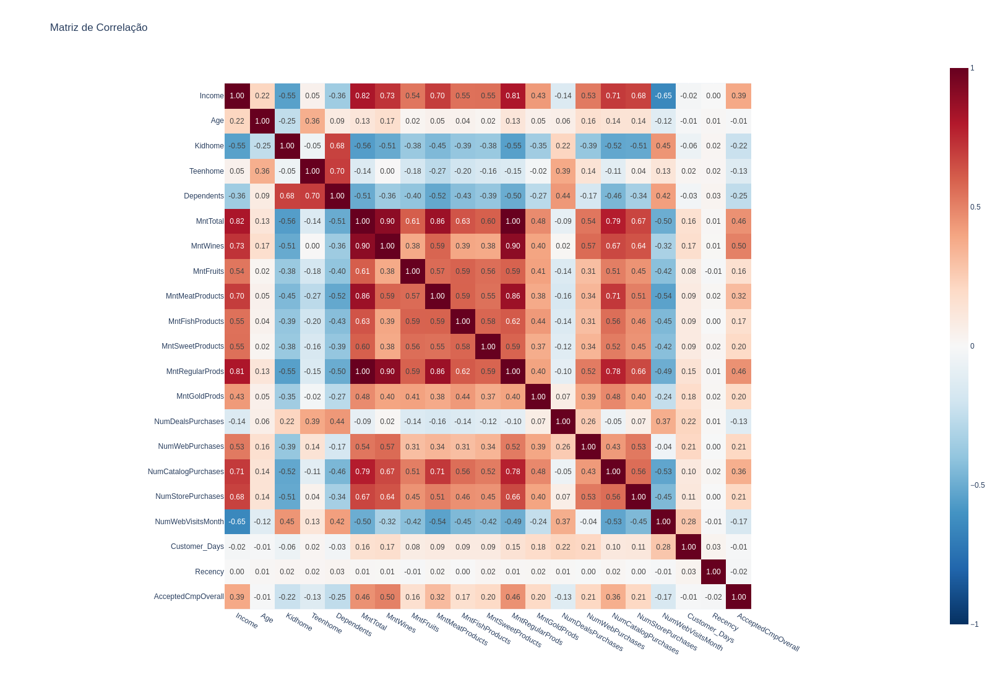

In [20]:
df_plot = df[['Income', 'Age', 'Kidhome','Teenhome',  'Dependents', 'MntTotal', 'MntWines', 'MntFruits',
              'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntRegularProds',
              'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases',
              'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Days', 'Recency', 'AcceptedCmpOverall' ]]
corr = df_plot.corr()

fig = px.imshow(corr,
                x=corr.columns,
                y=corr.columns,
                color_continuous_scale='RdBu_r',  # Escolha sua escala de cores
                title="Matriz de Correlação",
                zmin = -1,
                zmax=1,
                text_auto=True)

fig.update_layout(width=1100, height=1100)
fig.update_traces(texttemplate="%{z:.2f}")

fig.show()


### Gasto com produtos

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

- Observa-se uma correlação positiva significativa entre a renda e o total de produtos consumidos, o que sugere que aqueles com rendas mais altas tendem a gastar mais. 
- Além disso, notamos uma tendência interessante relacionada ao aumento da renda e o consumo de produtos nas categorias de vinho, carne e produtos do selo Regular. Isso se reflete nas correlações mais expressivas da renda com essas categorias. Abaixo, estão representados gráficos que ilustram a relação entre a renda e a quantidade gasta em cada categoria de produtos.

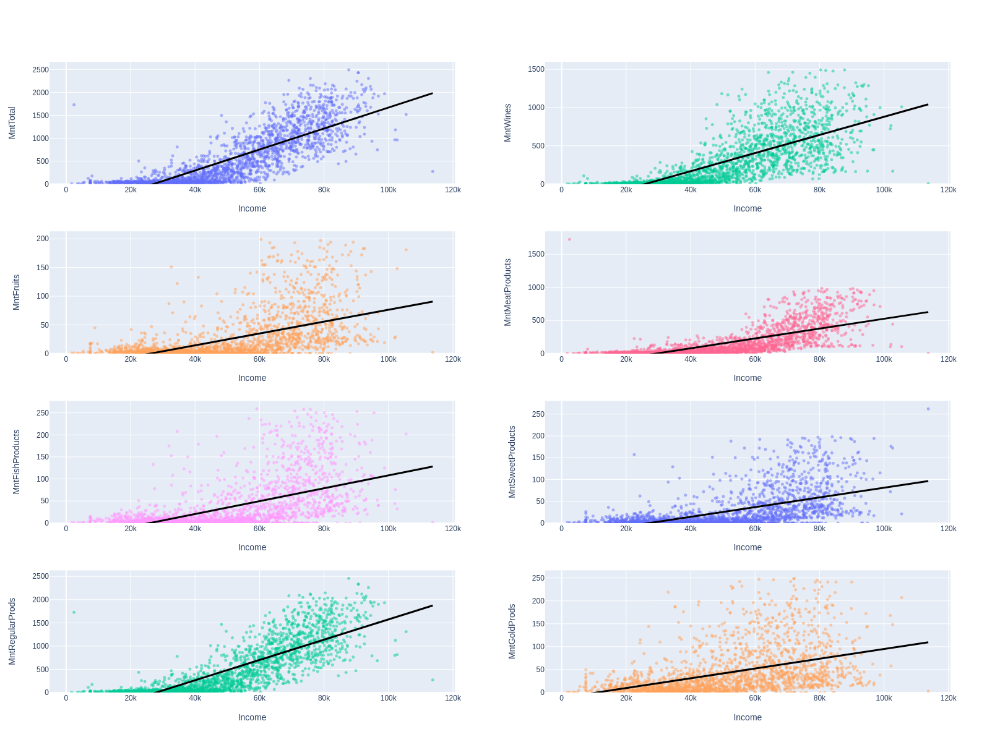

In [21]:
import statsmodels.api as sm
df_plot = df[['MntTotal', 'MntWines', 'MntFruits','MntMeatProducts',
              'MntFishProducts', 'MntSweetProducts','MntRegularProds','MntGoldProds', 'Income']]


col_names = df_plot.columns
rows = 4
cols = 2
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        

        scatter_trace = go.Scatter(
            x=df_plot['Income'],
            y=df_plot[Var],
            mode='markers',
            marker=dict(size=5, opacity=0.5),
            name=Var,
            hoverinfo= 'none',
        )
        
        X = sm.add_constant(df_plot['Income']) 
        model = sm.OLS(df_plot[Var], X).fit()
        
        trendline_trace = go.Scatter(
            x=df['Income'],
            y=model.predict(X),
            mode='lines',
            line=dict(width=3, color = 'black'),
            name=Var+'_Trendline'
        )
        
        
        fig.add_trace(
            scatter_trace,
            row=(i+1),
            col=(j+1)
        )
        
        fig.add_trace(
            trendline_trace,
            row=(i+1),
            col=(j+1)
        )

        fig.update_xaxes(title_text='Income', row=(i+1), col=(j+1))
        fig.update_yaxes(title_text = Var, rangemode="nonnegative", row=(i+1), col=(j+1))

        k = k +1

fig.update_layout(
    showlegend = False,
    width=1500,
    height=1200,
)

fig.show()

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---


- Não há indícios de correlação significativa entre a idade e o total/tipos de produtos consumidos, conforme indicado pelo baixo valor do coeficiente de correlação.
- No entanto, ao analisarmos o boxplot a seguir, podemos observar um padrão interessante: há uma diminuição no total de produtos consumidos na faixa etária de 30 a 39 anos, seguida de um aumento no consumo de produto. Isto parece ser reflexo do perfil de renda por idade, que apresenta comportamento similar.

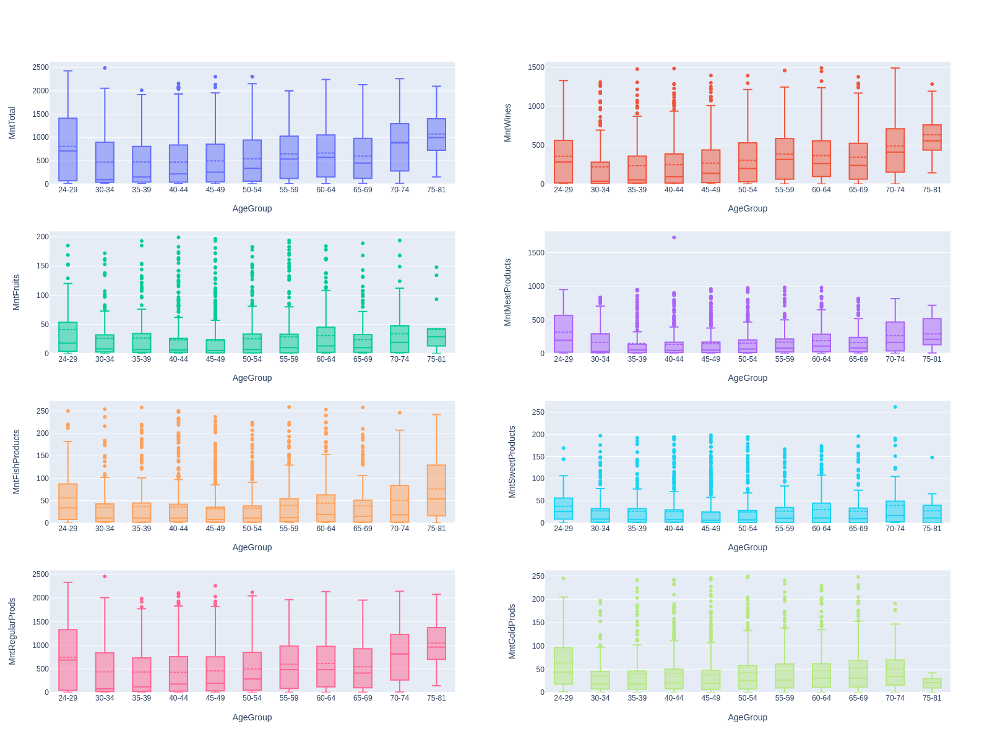

In [22]:
df_plot = df[['MntTotal', 'MntWines', 'MntFruits','MntMeatProducts',
              'MntFishProducts', 'MntSweetProducts', 'MntRegularProds','MntGoldProds', 'AgeGroup']]

col_names = df_plot.columns
rows = 4
cols = 2
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')
        

        fig.add_trace(
            go.Box(x=df_plot['AgeGroup'],
                   y=df_plot[Var],
                   name = Var,
                   boxmean=True,
                  ),row=(i+1), col=(j+1))
        
        fig.update_xaxes(title_text='AgeGroup', row=(i+1), col=(j+1), categoryorder='array', categoryarray= labels_age)
        fig.update_yaxes(title_text=Var, row=(i+1), col=(j+1))

        k = k +1

fig.update_layout(
    showlegend = False,
    width=1200,
    height=1200,
)
fig.update_yaxes(rangemode="tozero")

fig.show()

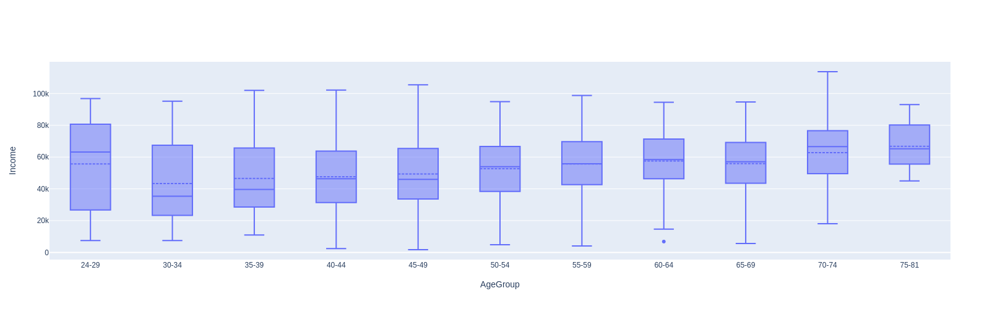

In [23]:


rows = 1
cols = 1
fig = make_subplots(rows=rows, cols=cols)


fig.add_trace(
    go.Box(x = df['AgeGroup'],
           y=df['Income'],
           name=df_plot.columns[i],
           boxmean=True
          ),
    row=(1), col=(1)
    )
    
fig.update_xaxes(title_text='AgeGroup', row=(1), col=(1), categoryorder='array', categoryarray= labels_age)
fig.update_yaxes(title_text='Income', row=(1), col=(1))

    
    
fig.update_layout(
    showlegend = False,
    width=1000,
        height=500,
)


<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---


- Observamos uma correlação negativa entre o número de crianças e o consumo total de produtos, enquanto o número de adolescentes não apresenta uma correlação significativa.

- Além disso, é interessante notar que o número de crianças também está negativamente correlacionado com a renda. Isso pode parecer contraditório, uma vez que a intuição geral seria que famílias com mais filhos teriam uma demanda de gastos maior, o que poderia impulsionar a busca por melhores salários. Essas tendências podem ser visualizadas no boxplot e no scatterplot abaixo.

- O número de dependentes não parece afetar a preferência por itens consumidos..

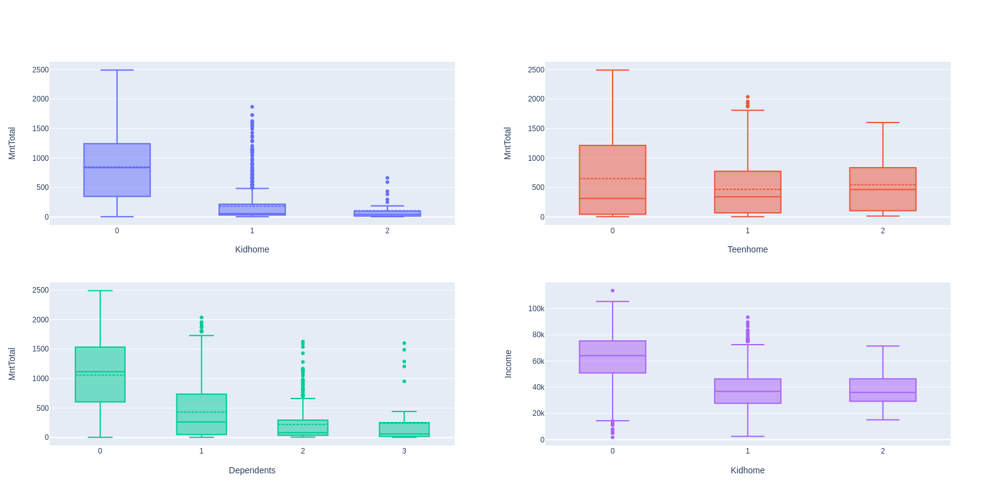

In [24]:
df_plot = df[['Kidhome', 'Teenhome', 'Dependents', 'MntTotal']]

Target = 'MntTotal'

col_names = df_plot.columns
rows = 2
cols = 2
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')
        

        fig.add_trace(
            go.Box(x=df_plot[Var],
                   y=df_plot['MntTotal'],
                   name=Var,
                   showlegend = False,
                   boxmean = True,
                  ),row=(i+1), col=(j+1))
        
        fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1))
        fig.update_yaxes(title_text='MntTotal', row=(i+1), col=(j+1))

        k = k +1
        
fig.add_trace(
            go.Box(x=df_plot['Kidhome'],
                   y=df['Income'],
                   #name='Income',
                   showlegend = False,
                  ),row=(2), col=(2))

fig.update_xaxes(title_text='Kidhome', row=(2), col=(2))
fig.update_yaxes(title_text='Income', row=(2), col=(2))

fig.update_layout(
    legend=dict(orientation="h"),
    width=1500,
    height=800,
)

fig.show()

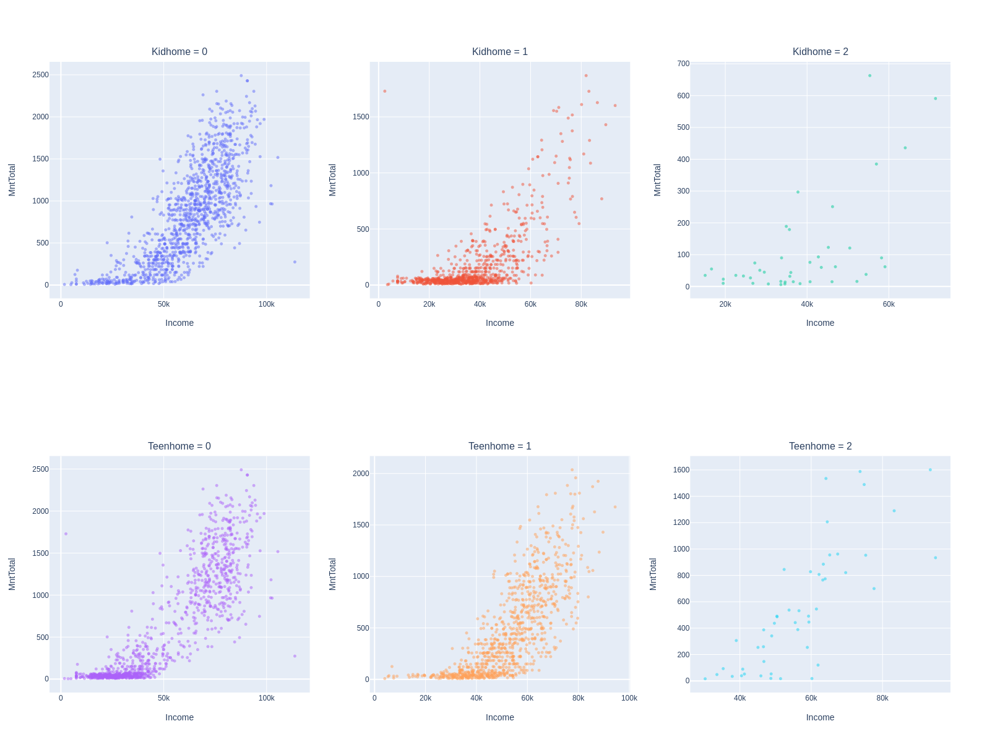

In [25]:
Var_to_filter_list = [ 'Kidhome', 'Teenhome']



rows = 2
cols = 3
fig = make_subplots(rows=rows, cols=cols,
                    subplot_titles=(
                        'Kidhome = 0', 'Kidhome = 1', 'Kidhome = 2', 
                        'Teenhome = 0', 'Teenhome = 1', 'Teenhome = 2',))

for i in range(rows):
    Var_to_filter = Var_to_filter_list[i]
    categ_Var_to_filter = df[Var_to_filter].unique()
    for j in range(len(categ_Var_to_filter)):
        
        df_filter = df[df[Var_to_filter]==categ_Var_to_filter[j]]
        fig.add_trace(
            go.Scatter(x=df_filter['Income'],
                       y=df_filter['MntTotal'],
                       mode = 'markers',
                       marker=dict(size=5, opacity=0.5),
                       hoverinfo= 'none',
                      ),row=(i+1), col=(j+1)
        )
        
        
        fig.update_xaxes(title_text='Income', row=(i+1), col=(j+1))
        fig.update_yaxes(title_text='MntTotal', row=(i+1), col=(j+1))



fig.update_layout(
    showlegend=False,
    width=1600,
    height=1200,
)

fig.show()

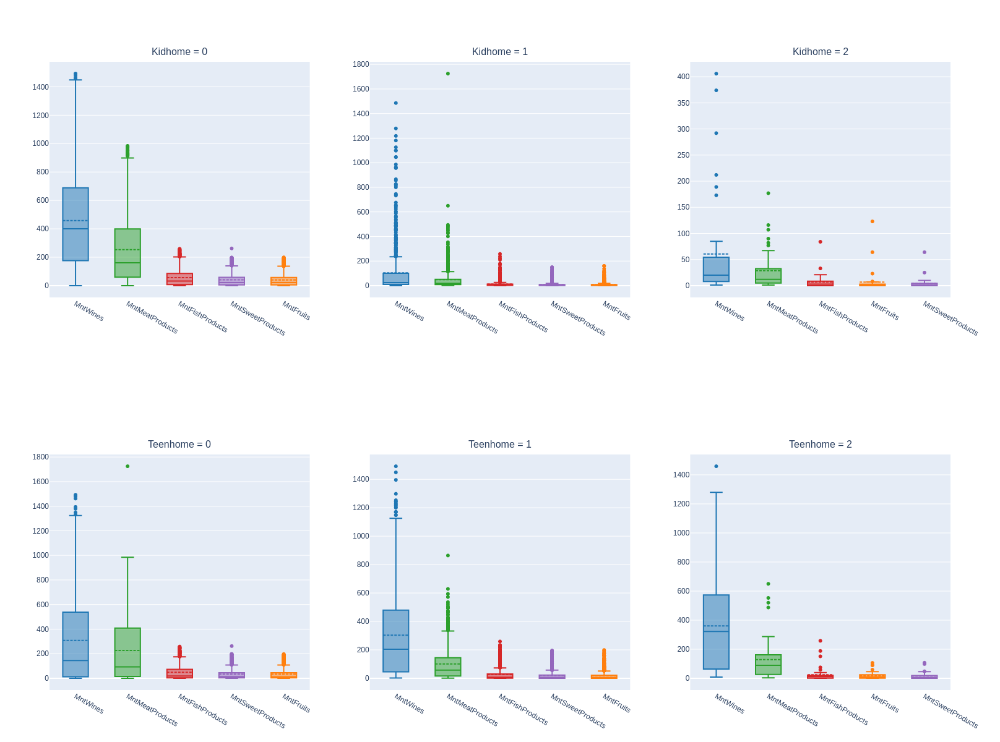

In [26]:
Var_to_filter_list = [ 'Kidhome', 'Teenhome']
Var_plot = ['MntWines', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts']

rows = 2
cols = 3
fig = make_subplots(rows=rows, cols=cols,
                    subplot_titles=(
                        'Kidhome = 0', 'Kidhome = 1', 'Kidhome = 2', 
                        'Teenhome = 0', 'Teenhome = 1', 'Teenhome = 2',))

color_pallete = ['#1f77b4','#ff7f0e',  '#2ca02c',  '#d62728', '#9467bd']
for i in range(rows):
    Var_to_filter = Var_to_filter_list[i]
    categ_Var_to_filter = df[Var_to_filter].unique()
    for j in range(len(categ_Var_to_filter)):
        
        df_filter = df[df[Var_to_filter]==categ_Var_to_filter[j]]
        
        index_sort = np.array(df_filter[Var_plot].mean().sort_values(ascending=False).index)        
        for k in range(len(Var_plot)):
            
            fig.add_trace(
                go.Box(y=df_filter[Var_plot[k]],
                       #y=df_filter['MntTotal'],
                       boxmean = True,
                       name = Var_plot[k],
                       marker_color= color_pallete[k],

                          ),row=(i+1), col=(j+1)
            )


            fig.update_xaxes( row=(i+1), col=(j+1), categoryorder='array', categoryarray= index_sort)
            fig.update_yaxes( row=(i+1), col=(j+1))



fig.update_layout(
    showlegend=False,
    width=1600,
    height=1200,
)

fig.show()

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---


- Uma análise do consumo em relação às variáveis categóricas, que não estão incluídas na matriz de correlação, revela algumas descobertas interessantes:
    - Os clientes que aceitaram as campanhas anteriores tendem a gastar mais.
    - Indivíduos com níveis mais elevados de educação também tendem a gastar mais. Note ainda que os individuos de renda mais baixa concentram praticamente todos os de educação básica.
    - Surpreendentemente, o estado civil não parece exercer influência significativa sobre os gastos das pessoas.

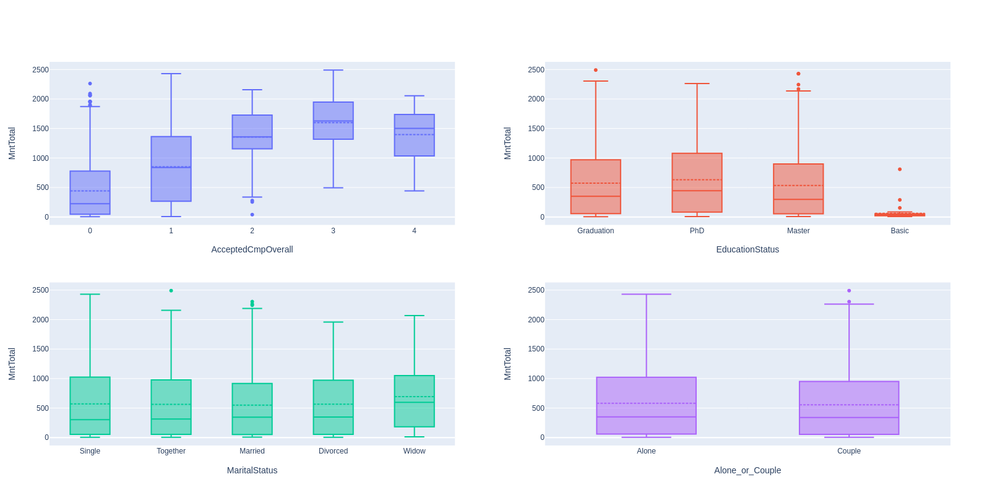

In [27]:
df_plot = df[['AcceptedCmpOverall', 'EducationStatus', 'MaritalStatus', 'Alone_or_Couple', 'MntTotal']]

Target = 'MntTotal'

col_names = df_plot.columns
rows = 2
cols = 2
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')
        

        fig.add_trace(
            go.Box(x=df_plot[Var],
                   y=df_plot['MntTotal'],
                   name=Var,
                   showlegend = False,
                   boxmean = True,
                  ),row=(i+1), col=(j+1))
        
        fig.update_xaxes(title_text=Var, row=(i+1), col=(j+1))
        fig.update_yaxes(title_text='MntTotal', row=(i+1), col=(j+1))

        k = k +1
        

fig.update_layout(
    legend=dict(orientation="h"),
    width=1500,
    height=800,
)

fig.show()

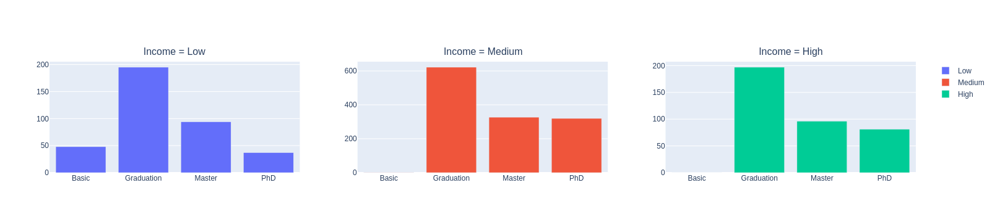

In [28]:
df_aux = df.copy()
limits_income2 = [0, df_aux.describe().loc['mean']['Income'] - df_aux.describe().loc['std']['Income'],
              df_aux.describe().loc['mean']['Income'] + df_aux.describe().loc['std']['Income'],
             float('inf')]

labels_income2 = ['Low', 'Medium', 'High']
df_aux['IncomeGroup2'] = pd.cut(df_aux['Income'], bins=limits_income2, labels=labels_income2)

Var_to_filter = 'IncomeGroup2'
Var = 'EducationStatus'
categ_Var_to_filter = ['Low', 'Medium', 'High']



rows = 1
cols = 3
fig = make_subplots(rows=rows, cols=cols,
                    subplot_titles=(
                        'Income = Low', 'Income = Medium', 'Income = High',
                    ))


group = df_aux.groupby(Var)[Var_to_filter].agg(['value_counts']).reset_index()
group.columns = [Var, Var_to_filter, 'count']


for i in range(len(categ_Var_to_filter)):
    
    filtered_group = group[group[Var_to_filter] == categ_Var_to_filter[i]]
    
    fig.add_trace(
            go.Bar(
                x=filtered_group[Var],
                y=filtered_group['count'],
                name=categ_Var_to_filter[i],
            ), row=(1), col=(i+1)
        )
    
fig.show()


### Local de compra

<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

- Observamos que o número de compras varia de acordo com o local e aumenta à medida que a renda cresce. Esse comportamento é esperado, já que geralmente quem ganha mais tende a gastar mais.
- O número de visitas à página da web diminui à medida que a renda aumenta.
- Além disso, notamos que o número de visitas à página da web apresenta um comportamento inicial de diminuição com o aumento do número de compras na web, seguido por um aumento posterior.
- Não há mudança significativa desse comportamento com a idade

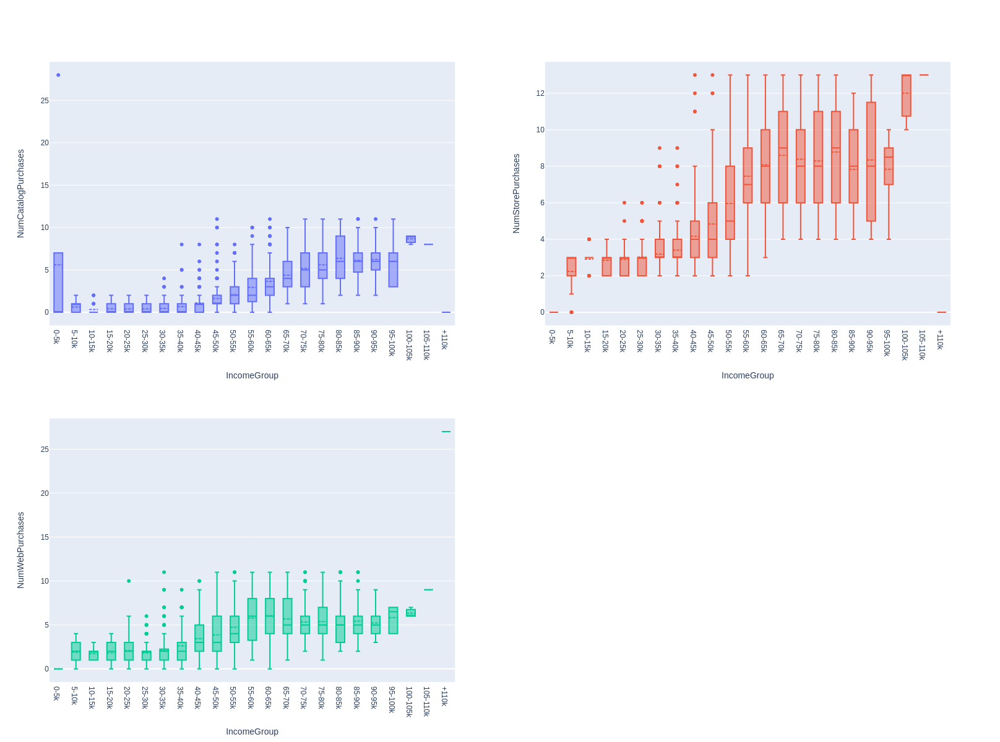

In [29]:
df_plot = df[['NumCatalogPurchases', 'NumStorePurchases', 'NumWebPurchases','IncomeGroup']]



col_names = df_plot.columns
rows = 2
cols = 2
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')        

        fig.add_trace(
            go.Box(x=df_plot['IncomeGroup'],
                   y=df_plot[Var],
                   name=Var,
                   boxmean = True, 
                  ),row=(i+1), col=(j+1)
            )
            

        
        fig.update_xaxes(title_text='IncomeGroup', row=(i+1), col=(j+1), categoryorder='array', categoryarray= labels_income)
        fig.update_yaxes(title_text=Var, row=(i+1), col=(j+1))

        k = k +1

        
fig.update_layout(
    showlegend = False,
    width=1200,
    height=1200,
)

fig.show()

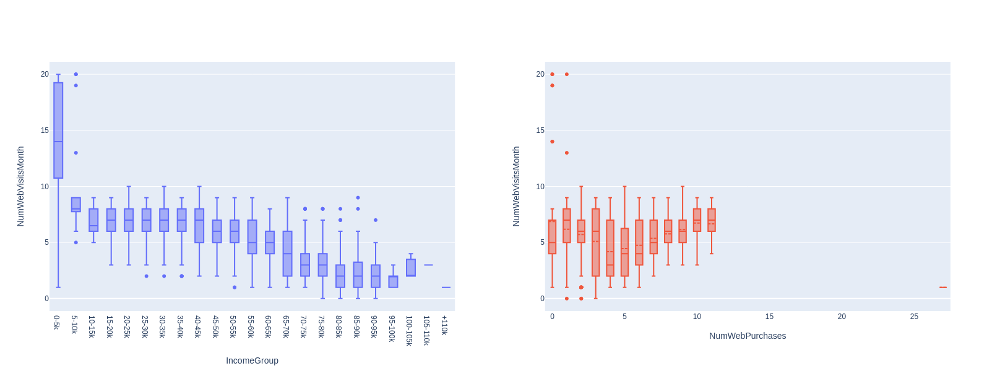

In [30]:
rows = 1
cols = 2
fig = make_subplots(rows=rows, cols=cols)


fig.add_trace(
    go.Box(x=df['IncomeGroup'],
           y=df['NumWebVisitsMonth'],
          ), row = 1, col = 1
)

fig.update_xaxes(title_text='IncomeGroup', row=1, col=1, categoryorder='array', categoryarray= labels_income)
fig.update_yaxes(title_text='NumWebVisitsMonth', row=1, col=1)

fig.add_trace(
    go.Box(x=df['NumWebPurchases'],
           y=df['NumWebVisitsMonth'],
           boxmean = True,
          ), row = 1, col = 2
)

fig.update_xaxes(title_text='NumWebPurchases', row=1, col=2)
fig.update_yaxes(title_text='NumWebVisitsMonth', row=1, col=2)


fig.update_layout(
    showlegend=False,
    width=1200,
    height=600,
)

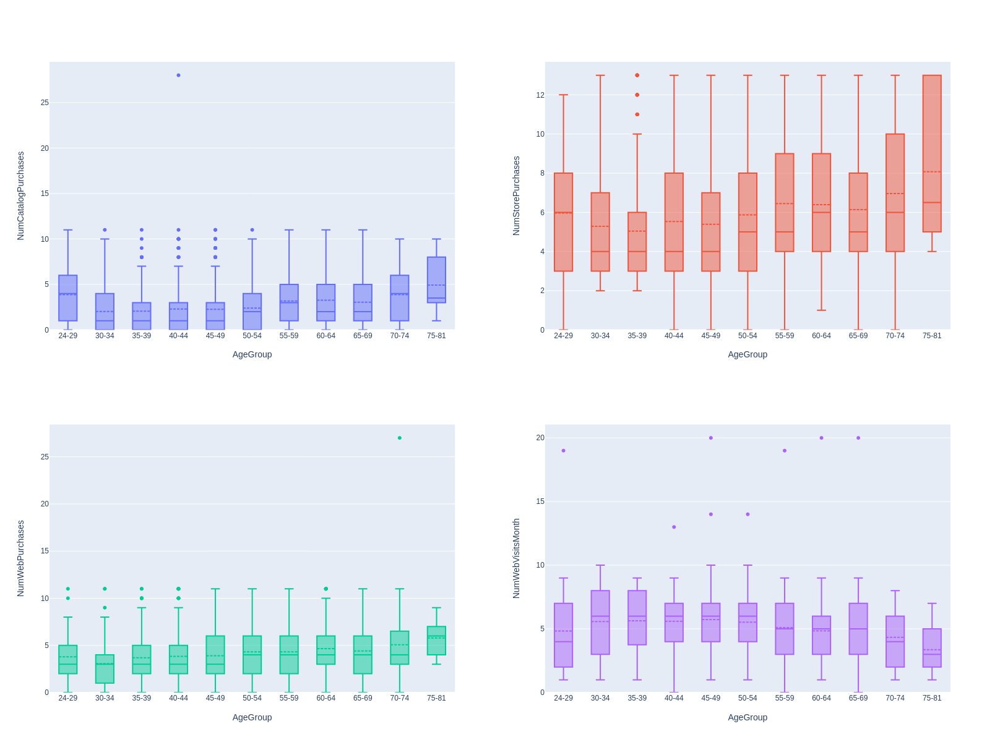

In [31]:
df_plot = df[['NumCatalogPurchases', 'NumStorePurchases', 'NumWebPurchases','NumWebVisitsMonth','AgeGroup']]




col_names = df_plot.columns
rows = 2
cols = 2
fig = make_subplots(rows=rows, cols=cols)

k = 0
for i in range(rows):
    for j in range(cols):
        if k==(len(col_names) - 1):
            break
            
        Var = col_names[k]        
        if df_plot[Var].dtypes != 'category':
            df_plot = df_plot.copy()
            df_plot[Var] = df_plot[Var].astype('category')
        

        fig.add_trace(
            go.Box(x=df_plot['AgeGroup'],
                   y=df_plot[Var],
                   name = Var,
                   boxmean=True,
                  ),row=(i+1), col=(j+1))
        
        fig.update_xaxes(title_text='AgeGroup', row=(i+1), col=(j+1), categoryorder='array', categoryarray= labels_age)
        fig.update_yaxes(title_text=Var, row=(i+1), col=(j+1))

        k = k +1

fig.update_layout(
    showlegend = False,
    width=1200,
    height=1200,
)
fig.update_yaxes(rangemode="tozero")

fig.show()

## 2.3. Recomendações


<div style="font-size: 18px; font-weight: bold;"><u>Acerca de receptividade da campanha </u></div>


- Tendem a aceitar melhor a campanha os clientes que possuem pelo menos uma dessas características:
    - Maior renda
    - Mais antigos
    - Que fizeram a última compra mais recentemente
    - Sem dependentes (crianças ou adolescentes)
    - Que compram em catálogos
    - Que aceitaram campanhas antigas
    

- Os produtos mais vendidos em geral são vinhos e carnes (ou seja, o cliente médio gastou mais nesses itens).

- Os locais de compra mais frequentes são lojas físicas e web.

 > **<u>Ação sugerida</u>**: Concentrar as campanhas publicitárias nos clientes com pelo menos uma das características acima e nos itens mais vendidos, independente do canal de vendas. 

<div style="font-size: 18px; font-weight: bold;"><u>Acerca de segmentação de clientes </u></div>

- Clientes com criança tendem a gastar menos.

 > **<u>Ação sugerida</u>**:  A empresa pode criar pacotes de produtos personalizados para famílias com crianças visando aumentar o consumo entre aqueles com crianças.


- Há um comportamento complexo de clientes que fazem mais compras online e visitam mais a página da web.
    
 > **<u>Ação sugerida</u>**: A empresa pode realizar análises adicionais para entender melhor esse relacionamento e otimizar a experiência online.


- O canal com desempenho inferior em geral são compras via catálogo. Apesar disso, há uma grande receptividade da campanha dos clientes que compram em catálogo.

 > **<u>Ação sugerida</u>**: Buscar formas de impulsionar as vendas via catálogo.
   

# 3. Modelagem preditiva



Nesta seção, exploraremos a criação de um modelo preditivo específico para o nosso problema de receptividade de campanhas de marketing. A modelagem preditiva é uma etapa crítica na análise de dados que visa criar modelos matemáticos ou estatísticos capazes de fazer previsões com base em dados históricos e padrões identificados. Para nosso caso, sso permitirá direcionar recursos de marketing de forma mais eficiente, evitar gastos desnecessários e, ao mesmo tempo, melhorar a eficácia da campanha.

Ao longo desta seção, abordaremos as etapas essenciais do processo de modelagem. Discutiremos como selecionar os recursos mais relevantes, ajustar os parâmetros do modelo e escolher as métricas de avaliação adequadas. O objetivo final é criar um modelo preditivo preciso e valioso que ajude a tomar decisões informadas e estratégicas no contexto das campanhas de marketing.

## 3.1. Seleção de recursos

Iremos utilizar todas as variáveis originais da nossa base de dados, excluindo as varáveis que criamos para análise exploratória.

Nesta etapa separamos os dados entre features (X) e target (y), além disso, separamos entre base de treino e base de teste utilizando a função `train_test_split`. Uma vez que a nossa variável target é desbalanceada (há a ocorrência de muitos 0's e poucos 1's), fazemos a estratificação dos dados, de forma que a base de teste tenham a mesma proporção de resultados que a base de treino.

In [32]:

var = ['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain',  'Age', 'Customer_Days',
       'marital_Divorced', 'marital_Married', 'marital_Single',
       'marital_Together', 'marital_Widow', 'education_Basic',
       'education_Graduation', 'education_Master', 'education_PhD', 'MntTotal',
       'MntRegularProds', 'AcceptedCmpOverall', 'Response']

df_ = df[var]

X = df_.drop(columns='Response')
y = df['Response']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)


## 3.2. Seleção de métricas

Ao construir modelos de aprendizado de máquina, a seleção das métricas corretas é uma etapa crítica para avaliar o desempenho e a eficácia do modelo. Métricas são ferramentas essenciais que permitem quantificar o quão bem um modelo está se saindo em relação aos dados de teste ou validação. Para um problema de classificação binária, há várias métricas que podemos utilizar, elas sendo baseada na matriz de confusão. Ela fornece uma visão detalhada do desempenho de um modelo, comparando suas previsões com os valores reais dos dados.

<div style="font-size: 24px; font-weight: bold;"><u>Matriz de confusão e métricas</u></div>


A matriz de confusão é composta por quatro elementos principais:

- **Verdadeiros Positivos (TP)**: São os casos em que o modelo previu corretamente a classe positiva.

- **Falsos Positivos (FP)**: Representam os casos em que o modelo previu incorretamente a classe positiva quando a classe real era negativa.

- **Verdadeiros Negativos (TN)**: São os casos em que o modelo previu corretamente a classe negativa.

- **Falsos Negativos (FN)**: Representam os casos em que o modelo previu incorretamente a classe negativa quando a classe real era positiva.

A seguir, apresentaremos as métricas que usaremos ao longo da nossa análise.

<div style="font-size: 18px; font-weight: bold;">Acurácia (Accuracy)</div>


A acurácia mede a proporção de previsões corretas em relação ao total de previsões. É uma métrica geralmente utilizada, mas pode ser enganosa em conjuntos de dados desbalanceados.

$$ \text{Acurácia} = \frac{TP + TN}{TP + TN + FP + FN} $$


<div style="font-size: 18px; font-weight: bold;">Precisão (Precision))</div>

A precisão mede a proporção de verdadeiros positivos em relação ao total de previsões positivas. É uma métrica importante quando queremos ter certeza de que as previsões positivas são realmente precisas.

$$ \text{Precisão} = \frac{TP}{TP + FP} $$

<div style="font-size: 18px; font-weight: bold;">Revocação (Recall ou Sensibilidade)</div>


A revocação mede a proporção de verdadeiros positivos em relação ao total de casos positivos reais. É útil quando queremos identificar o máximo possível de casos positivos, minimizando os falsos negativos.

$$ \text{Revocação} = \frac{TP}{TP + FN} $$

<div style="font-size: 18px; font-weight: bold;">F1-Score</div>

O F1-Score é a média harmônica da precisão e da revocação. É útil quando você deseja equilibrar a trade-off entre precisão e revocação.

$$ \text{F1-Score} = 2 \times \frac{\text{Precisão} \times \text{Revocação}}{\text{Precisão} + \text{Revocação}} $$

<div style="font-size: 24px; font-weight: bold;"><u>Porque iremos utilizar essas métricas?</u></div>

No nosso problema, a empresa sofreu prejuízo com a campanha. Aumentar a eficácia da campanha deve significar também reverter esse cenário e buscar uma maximização de lucros. 

De acordo com as informações fornecidas, a campanha foi construída com 2240 clientes e teve um custo de \\$6.720, de forma que o custo da campanha por consumidor é de \\$3. Além disso, 15% dos consumidores responderam positivamente e a receita gerada foi de \\$3674, de forma que a receita por cliente é aproximadamente igual a \\$11. Por fim, o prejuizo tomado pela empresa foi de \\$3046 de forma que o lucro por cliente é igual a -\\$1.36.

Nosso modelo de classificação binária servirá para selecionarmos os clientes que serão contatados para a campanha, ou seja, irão ser contatados todos os resultados positivos que o modelo gerar, isto incluindo verdadeiros positivos e falsos positivos. Assim, podemos escrever

$$\text{Clientes selecionados} = TP + FP$$

O lucro por cliente pode ser quantificado da seguinte forma:

$$
\begin{align}
\text{Lucro por cliente} &= \frac{11 \times TP - 3 \times \text{Clientes selecionados}}{\text{Clientes selecionados}}\\
&= \frac{11 \times TP - 3 \times (TP + FP)}{TP + FP}\\
&= 11 \times \frac{TP}{TP + FP} - 3 \\
& = 11 \times \text{Precisão} - 3
\end{align}
$$ 

De certo, a precisão é a métrica mais importante caso queiramos maximizar o lucro por cliente selecionado. Entretando, a precisão não se importa com o nuúmero de falsos positivos, de forma que um modelo com precisão alta pode gerar como resultado um número de clientes selecionados baixo. Queremos tambem selecionar um número significativo de clientes para que a campanha atinja mais pessoas. Neste caso, devemos nos preocupar também com número verdadeiros positivos com relação aos positivos observados, ou seja a revocação (recall). A métrica que visa equilibrar a precisão e o recall é o F1-score, em que utilizaremos ele para comparar nossos modelos.


## 3.3. Modelos utilizados e tunagem de hiperparâmetos

Iremos utilizar os seguintes modelos para comparar e encontrar o melhor modelo.

- Árvore de Decisão
- Random Forest
- XGBoost
- Regressão Logística

Para cada um desses modelos, iremos fazer a tunagem de hiperparâmetros. Hiperparâmetros são configurações ajustáveis que não são aprendidas pelo modelo, mas têm um impacto significativo em seu desempenho. A tunagem de hiperparâmetros envolve a busca pelas melhores combinações de valores para esses parâmetros, com o objetivo de otimizar o desempenho do modelo. A estratégia que adotamos é a seguinte:

1. Fazemos um modelo base, com os parâmetros default da função
2. Em seguida, realizamos um Random Grid Search em um range grande para cada hiperparâmetro escolhido e tomamos aquele com maior F1-score
3. Para o modelo que apresentar um F1-score maior entre o modelo base e escolhido na etapa acima, fazemos um Grid Search nas vizinhanças dos valores do conjunto de hiperparâmetros.

Para a avaliação das métricas tanto do modelo base quanto nos Grid Search, utilizamos um Cross Validation k-fold com 5 folds estratificados, devido a natureza desbalanceada das classes do target.

Vale comentar que o tempo de execução destes processos são longos, portanto, aconselhamos que não executem os comandos novamente. Para evitar isto, os blocos em que realizamos os Grid Search estão comentados e exportamos os resultados para um arquivo de texto.

## 3.4. Modelagem

In [33]:
def evaluate_model(model_name, X_train, y_train, X_test, y_test,  params = None):
    model_name = model_name.lower() 
    
    model_mapping = {
        'randomforestclassifier': RandomForestClassifier,
        'decisiontreeclassifier': DecisionTreeClassifier,
        'gradientboostingclassifier': GradientBoostingClassifier,
        'logisticregression': LogisticRegression
    }
    
    if model_name in model_mapping:
        
        

        if params ==None:
            model = model_mapping[model_name](random_state = 42)
            print('\nDefault parameters:')
            print(model.get_params(), '\n')
        else:
            model = model_mapping[model_name](**params)
            print('\nBest parameters:')
            print(params, '\n')
        
        
        
        n_splits = 5
        cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
        mean_accuracy = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy').mean()
        mean_f1 = cross_val_score(model, X_train, y_train, cv=cv, scoring='f1').mean()
        mean_precision = cross_val_score(model, X_train, y_train, cv=cv, scoring='precision').mean()
        mean_recall = cross_val_score(model, X_train, y_train, cv=cv, scoring='recall').mean()
        
        
        
        model.fit(X_train, y_train)
        accuracy_test = model.score(X_test, y_test)
        f1_test = f1_score(y_test, model.predict(X_test), average='binary')
        precision_test = precision_score(y_test, model.predict(X_test), average='binary')
        recall_test = recall_score(y_test, model.predict(X_test), average='binary')

        accuracy = [mean_accuracy, accuracy_test]
        f1 = [mean_f1, f1_test]
        precision = [mean_precision, precision_test]
        recall = [mean_recall, recall_test]

        model_metrics = pd.DataFrame({'Accuracy': accuracy,  'F1-score': f1, 'Precision': precision, 'Recall': recall}, index = ['Train ' + str(n_splits) + '-fold', 'Test'])
        #model_metrics.style.format({'Accuracy': '{:.2%}', 'ROC-AUC': '{:.2%}'})
        
        return model, model_metrics, 
    else:
        raise ValueError(f"Model '{model_name}' not supported. Choose between: {', '.join(model_mapping.keys())}")

### - Árvore de decisão

Uma **árvore de decisão** é um modelo amplamente utilizado no aprendizado de máquina para tarefas de classificação e regressão. No entanto, essas árvores podem ficar muito complexas, levando ao **overfitting**. Para mitigar isso, usamos técnicas de **poda**.

A **pré-poda** envolve a definição de critérios antes da construção da árvore, como limites para a profundidade máxima da árvore. Já a **pós-poda** remove ramos não essenciais após a construção da árvore, com base em critérios de importância de características ou medidas de impureza.

Nesta seção, faremos um **GridSearch** para otimizar esses hiperparâmetros de poda em uma árvore de decisão. Tomamos esta abordagem pois a árvore de decisão possui um tempo de execução baixo, nos permitindo explorar uma rede mais fina em um tempo relativamente curto. Em seguida, compararemos métricas de desempenho (F1-score, precisão e recall), para determinar a abordagem de poda mais eficaz. Além disso, exploraremos as **importâncias das características** para identificar quais variáveis influenciam mais nas decisões do modelo. Isso é essencial para a interpretação do modelo

#### Modelo base

In [34]:
tree_base, tree_base_metrics = evaluate_model('DecisionTreeClassifier', X_train, y_train, X_test, y_test, params = None)  



Default parameters:
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 42, 'splitter': 'best'} 



In [35]:
tree_base_metrics.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
Train 5-fold,82.86%,45.81%,44.91%,46.81%
Test,80.03%,39.20%,36.79%,41.94%


#### Grid Search - Post Pruning

In [36]:
grid_params = {
    'ccp_alpha': pd.DataFrame(tree_base.cost_complexity_pruning_path(X_train, y_train))['ccp_alphas'].values.tolist(),
    'random_state': [42]
}

In [37]:
total_combinations = len(list(product(*grid_params.values())))

print("Total number of combinations:", total_combinations)

Total number of combinations: 74


In [38]:
# # Do not run!!
# tree_ = DecisionTreeClassifier()


# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# grid_search_tree = GridSearchCV(
#     tree_,
#     grid_params,
#     cv=cv,
#     verbose = 3,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy'
# )

# grid_search_tree.fit(X_train, y_train)
# pd.DataFrame(grid_search_tree.cv_results_).to_csv('gridsearch/tree_postpruning.csv', index = False)

In [39]:
order_by = 'mean_test_f1'
results_file = 'gridsearch/tree_postpruning.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
49,"{'ccp_alpha': 0.001739476169176482, 'random_st...",0.844909,0.478177,0.502106,0.458668,0.017457
50,"{'ccp_alpha': 0.00174568472542361, 'random_sta...",0.844909,0.478177,0.502106,0.458668,0.017319
51,"{'ccp_alpha': 0.001793086626573682, 'random_st...",0.845613,0.477420,0.506422,0.454123,0.017383
52,"{'ccp_alpha': 0.0018313446075485732, 'random_s...",0.844906,0.476121,0.503061,0.454123,0.017516
43,"{'ccp_alpha': 0.0015738117721120555, 'random_s...",0.842062,0.476110,0.490929,0.463108,0.020181


In [40]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

tree_gs_post_bestF1, tree_gs_post_bestF1_metrics = evaluate_model('DecisionTreeClassifier', X_train, y_train, X_test, y_test, params = params_best)  

tree_gs_post_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'ccp_alpha': 0.001739476169176482, 'random_state': 42} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,84.49%,47.82%,50.21%,45.87%
Test,83.33%,39.52%,44.59%,35.48%


#### Grid Search - Pre Pruning

In [41]:
grid_params = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, None],
    'min_samples_split': [2, 4, 8, 16, 32],
    'min_samples_leaf': [1, 2, 4, 8, 16, 32],
    'max_features': ['sqrt', 'log2'],
    'random_state': [42]
}

In [42]:
total_combinations = len(list(product(*grid_params.values())))

print("Total number of combinations:", total_combinations)

Total number of combinations: 1800


In [43]:
# # Do not run!!
# tree_ = DecisionTreeClassifier()


# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# grid_search_tree = GridSearchCV(
#     tree_,
#     grid_params,
#     cv=cv,
#     verbose = 3,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy'
# )

# grid_search_tree.fit(X_train, y_train)
# pd.DataFrame(grid_search_tree.cv_results_).to_csv('gridsearch/tree.csv', index = False)

In [44]:
order_by = 'mean_test_f1'
results_file = 'gridsearch/tree.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
540,"{'criterion': 'gini', 'max_depth': None, 'max_...",0.831431,0.460542,0.459434,0.463214,0.008092
570,"{'criterion': 'gini', 'max_depth': None, 'max_...",0.831431,0.460542,0.459434,0.463214,0.008292
1142,"{'criterion': 'entropy', 'max_depth': None, 'm...",0.836411,0.459840,0.469274,0.454334,0.007943
1172,"{'criterion': 'entropy', 'max_depth': None, 'm...",0.836411,0.459840,0.469274,0.454334,0.008247
1772,"{'criterion': 'log_loss', 'max_depth': None, '...",0.836411,0.459840,0.469274,0.454334,0.007802


In [45]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

tree_gs_pre_bestF1, tree_gs_pre_bestF1_metrics = evaluate_model('DecisionTreeClassifier', X_train, y_train, X_test, y_test, params = params_best)  

tree_gs_pre_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 42} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,83.14%,46.05%,45.94%,46.32%
Test,80.36%,40.20%,37.74%,43.01%


#### Comparação

Embora os resultados do F1-score tenham sido bastante semelhantes entre os métodos de pré-poda e pós-poda, a análise das importâncias das características fornece insights valiosos. No método de pré-poda, o gráfico de importância das características revela que o modelo considera muitas das características, o que sugere uma abordagem mais inclusiva. Por outro lado, no método de pós-poda, observamos que várias características não exercem influência significativa sobre o modelo, mesmo que essas características não sejam particularmente relevantes no modelo base e no método de pré-poda. Isso indica que o método de pré-poda pode ser mais adequado para construir um modelo mais abrangente, levando em conta uma variedade de recursos, enquanto o método de pós-poda elimina características que têm pouca influência no desempenho do modelo.

In [46]:
models_metrics = [
    tree_base_metrics, tree_gs_post_bestF1_metrics, tree_gs_pre_bestF1_metrics, 
]

models_name = [
    'tree_base', 'tree_gs_post_bestF1', 'tree_gs_pre_bestF1', 
]


comparison = pd.concat([metric.loc['Test', :].rename(model) for metric, model in zip(models_metrics, models_name)], axis=1).T

In [47]:
comparison = comparison.sort_values(by='F1-score', ascending=False)
comparison.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
tree_gs_pre_bestF1,80.36%,40.20%,37.74%,43.01%
tree_gs_post_bestF1,83.33%,39.52%,44.59%,35.48%
tree_base,80.03%,39.20%,36.79%,41.94%


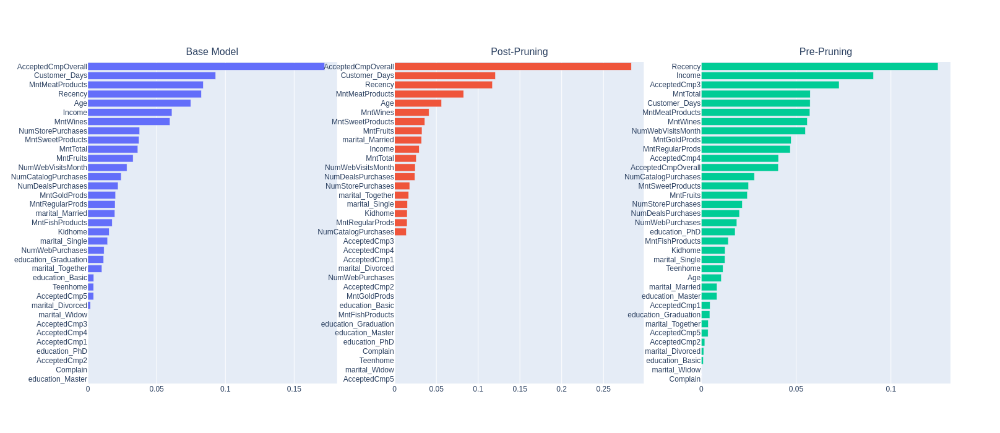

In [48]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Base Model", "Post-Pruning", "Pre-Pruning"))

# Base Model
sorted_idx_base = tree_base.feature_importances_.argsort()
trace_base = go.Bar(y=X_train.columns[sorted_idx_base], x=tree_base.feature_importances_[sorted_idx_base], orientation='h', name='Base Model')

# Post-Pruning
sorted_idx_post = tree_gs_post_bestF1.feature_importances_.argsort()
trace_post = go.Bar(y=X_train.columns[sorted_idx_post], x=tree_gs_post_bestF1.feature_importances_[sorted_idx_post], orientation='h', name='Post-Pruning')

# Pre-Pruning
sorted_idx_pre = tree_gs_pre_bestF1.feature_importances_.argsort()
trace_pre = go.Bar(y=X_train.columns[sorted_idx_pre], x=tree_gs_pre_bestF1.feature_importances_[sorted_idx_pre], orientation='h', name='Pre-Pruning')

fig.add_trace(trace_base, row=1, col=1)
fig.add_trace(trace_post, row=1, col=2)
fig.add_trace(trace_pre, row=1, col=3)

fig.update_layout(width=1600, height=700, showlegend=False)

fig.show()


<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

- Observa-se que uma variável que se demonstra extremamente importante é o `AcceptedCmpOverall`, ou seja, a receptividade das campanhas anteriores tem uma influência muito grande na classificação dos clientes.
- De maneira similar, podemos ver grande importância nas variáveis `Customer_Days` e `Recency`.
- A renda varia de importância.
- Mostra-se menos importante as variáveis relacionadas com educação, status marital e número de filhos.

### - Random Forest

Um **Random Forest** é um modelo que consiste em várias árvores de decisão, projetado para reduzir overfitting e melhorar o desempenho. Para otimizá-lo, realizaremos uma busca de hiperparâmetros dividida em duas etapas: uma busca ampla inicial (grid search grosseiro) e uma busca refinada subsequente (grid search fino). A poda em um Random Forest difere da abordagem de poda em uma única árvore de decisão, e é geralmente alcançada controlando o número de árvores na floresta e ajustando critérios de divisão e parâmetros de regulamentação. A otimização de hiperparâmetros nos ajudará a encontrar as configurações ideais para equilibrar a poda e a capacidade de previsão do modelo.

#### Modelo base

In [49]:
rf_base, rf_base_metrics = evaluate_model('RandomForestClassifier', X_train, y_train, X_test, y_test, params = None)  


Default parameters:
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False} 



In [50]:
rf_base_metrics.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
Train 5-fold,86.61%,36.27%,69.02%,24.79%
Test,85.81%,35.82%,58.54%,25.81%


#### Random Search Cross Validation

In [51]:
random_grid_params = {
    'n_estimators': [50, 150, 250, 350, 450, 550, 650],
    'max_depth': [2, 4, 6,8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'random_state': [42]
}

In [52]:
total_combinations = len(list(product(*random_grid_params.values())))

print("Total number of combinations:", total_combinations)

percent_20 = int(0.2 * total_combinations)

print("20% of the total of combinations:", percent_20)

Total number of combinations: 756
20% of the total of combinations: 151


In [53]:
# # Do not run!!
# rf_ = RandomForestClassifier()

# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# random_grid_rf = RandomizedSearchCV(
#     estimator = rf_,
#     param_distributions = random_grid_params,
#     n_iter = percent_20,
#     cv = cv,
#     verbose=3,
#     random_state=42,
#     n_jobs = -1,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy'
# )

# random_grid_rf.fit(X_train, y_train)
# random_grid_rf_results = random_grid_rf.cv_results_
# pd.DataFrame(random_grid_rf_results).to_csv('randomgrid/rf.csv', index = False)



In [54]:
order_by = 'mean_test_f1'
results_file = 'randomgrid/rf.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
113,"{'random_state': 42, 'n_estimators': 250, 'min...",0.866852,0.404157,0.654941,0.293869,2.101561
39,"{'random_state': 42, 'n_estimators': 250, 'min...",0.867556,0.393506,0.672513,0.279915,1.693746
20,"{'random_state': 42, 'n_estimators': 650, 'min...",0.865439,0.390003,0.648788,0.280021,4.724384
46,"{'random_state': 42, 'n_estimators': 150, 'min...",0.866143,0.382614,0.664670,0.270825,0.983479
71,"{'random_state': 42, 'n_estimators': 550, 'min...",0.866148,0.379231,0.673615,0.266385,3.257237


In [55]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

rf_rs_bestF1, rf_rs_bestF1_metrics = evaluate_model('RandomForestClassifier', X_train, y_train, X_test, y_test, params = params_best)  

rf_rs_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'random_state': 42, 'n_estimators': 250, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,86.69%,40.42%,65.49%,29.39%
Test,85.97%,37.96%,59.09%,27.96%


#### Grid Search

In [56]:
param_grid = { 
    'n_estimators': [150, 250, 350, 450],
    'max_depth' : [8, 10, None],
    'bootstrap': [True, False],
    'min_samples_leaf': [1, 2, 4],
    'min_samples_split':[2, 5, 8],
    'random_state': [42],
}

In [57]:
total_combinations = len(list(product(*param_grid.values())))

print("Total number of combinations:", total_combinations)

Total number of combinations: 216


In [58]:
# # Do not run!!
# rf_ = RandomForestClassifier()

# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# grid_search_rf = GridSearchCV(
#     rf_,
#     param_grid,
#     cv=cv,
#     verbose = 3,
#     n_jobs = -1,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy',
# )

# grid_search_rf.fit(X_train, y_train)
# pd.DataFrame(grid_search_rf.cv_results_).to_csv('gridsearch/rf.csv', index = False)

In [59]:
order_by = 'mean_test_f1'
results_file = 'gridsearch/rf.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
184,"{'bootstrap': False, 'max_depth': None, 'min_s...",0.868273,0.418707,0.660387,0.307611,1.051597
185,"{'bootstrap': False, 'max_depth': None, 'min_s...",0.866852,0.404157,0.654941,0.293869,1.922216
188,"{'bootstrap': False, 'max_depth': None, 'min_s...",0.866148,0.403571,0.646015,0.293658,1.001826
189,"{'bootstrap': False, 'max_depth': None, 'min_s...",0.866852,0.399923,0.655442,0.289218,1.764649
187,"{'bootstrap': False, 'max_depth': None, 'min_s...",0.867561,0.397774,0.665819,0.284672,3.213778


In [60]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

rf_gs_bestF1, rf_gs_bestF1_metrics = evaluate_model('RandomForestClassifier', X_train, y_train, X_test, y_test, params = params_best)  

rf_gs_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 150, 'random_state': 42} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,86.83%,41.87%,66.04%,30.76%
Test,85.81%,37.68%,57.78%,27.96%


#### Comparação

Os modelos Random Forest apresentaram um desempenho inferior em relação à Árvore de Decisão, refletido nos resultados mais baixos do F1-score. Além disso, ao analisar as importâncias das características nos três modelos, observamos que elas são notavelmente semelhantes e inclusivas. 

In [61]:
models_metrics = [
    rf_base_metrics, rf_rs_bestF1_metrics, rf_gs_bestF1_metrics,
]

models_name = [
    'rf_base', 'rf_rs_bestF1', 'rf_gs_bestF1',
]


comparison = pd.concat([metric.loc['Test', :].rename(model) for metric, model in zip(models_metrics, models_name)], axis=1).T

In [62]:
comparison = comparison.sort_values(by='F1-score', ascending=False)
comparison.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
rf_rs_bestF1,85.97%,37.96%,59.09%,27.96%
rf_gs_bestF1,85.81%,37.68%,57.78%,27.96%
rf_base,85.81%,35.82%,58.54%,25.81%


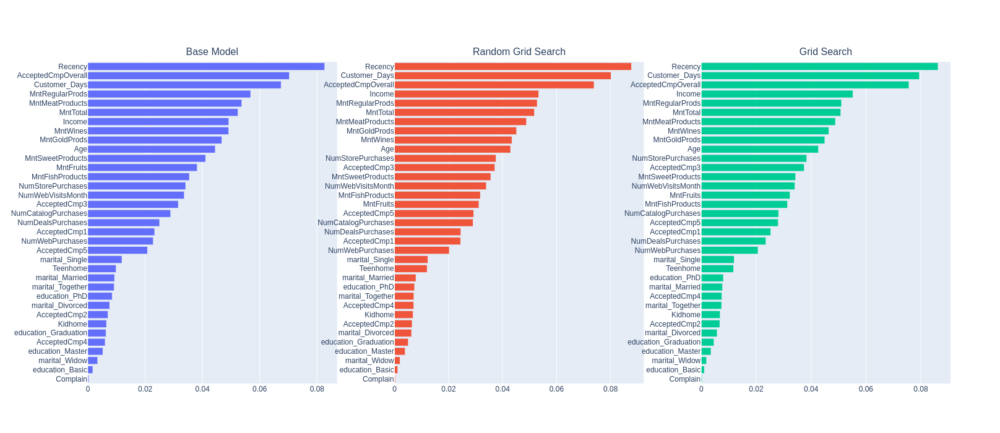

In [63]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Base Model", "Random Grid Search", "Grid Search"))

# Base Model
sorted_idx_base = rf_base.feature_importances_.argsort()
trace_base = go.Bar(y=X_train.columns[sorted_idx_base], x=rf_base.feature_importances_[sorted_idx_base], orientation='h', name='Base Model')

# Random Grid Search
sorted_idx_rs = rf_rs_bestF1.feature_importances_.argsort()
trace_rs = go.Bar(y=X_train.columns[sorted_idx_rs], x=rf_rs_bestF1.feature_importances_[sorted_idx_rs], orientation='h', name='Random Grid Search')

# Grid Search
sorted_idx_gs = rf_gs_bestF1.feature_importances_.argsort()
trace_gs = go.Bar(y=X_train.columns[sorted_idx_gs], x=rf_gs_bestF1.feature_importances_[sorted_idx_gs], orientation='h', name='Grid Search')

fig.add_trace(trace_base, row=1, col=1)
fig.add_trace(trace_rs, row=1, col=2)
fig.add_trace(trace_gs, row=1, col=3)

fig.update_layout(width=1600, height=700, showlegend=False)

fig.show()


<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

- A importância das variáveis são similares aos da árvore de decisão, havendo apenas um comportamento mais estável das variáveis ao longo dos modelos.

### - XGBoost

O **XGBoost** é um modelo de aprendizado de máquina que se baseia em uma coleção de árvores de decisão e é conhecido por seu desempenho sólido e habilidade de lidar com dados complexos. Para otimizar o XGBoost, seguiremos uma abordagem semelhante à do Random Forest, conduzindo uma busca de hiperparâmetros em duas etapas: uma busca ampla inicial (grid search grosseiro) e uma busca mais refinada subsequente (grid search fino). Ajustaremos hiperparâmetros relacionados à complexidade das árvores, como a profundidade máxima, a taxa de aprendizado e o número de árvores na floresta. Isso nos permitirá encontrar a combinação ideal de hiperparâmetros que equilibra a capacidade de previsão e a generalização do modelo XGBoost.

#### Modelo base

In [64]:
xgb_base, xgb_base_metrics = evaluate_model('GradientBoostingClassifier', X_train, y_train, X_test, y_test, params = None)  


Default parameters:
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 42, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 



In [65]:
xgb_base_metrics.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
Train 5-fold,86.90%,44.89%,64.10%,34.89%
Test,87.95%,49.66%,69.23%,38.71%


#### Random Search Cross Validation

In [66]:
random_grid_params = {
    'n_estimators': [100, 200, 300, 400, 500, 600, 700],
    'max_depth': [2,4, 6, 8, 10, None],
    'learning_rate': [0,1, 0.5, 1],
    'criterion': ['friedman_mse', 'squared_error'],
    'random_state': [42]
}

In [67]:
total_combinations = len(list(product(*random_grid_params.values())))


print("Total number of combinations:", total_combinations)

percent_20 = int(0.2 * total_combinations)

print("20% of the total of combinations:", percent_20)

Total number of combinations: 336
20% of the total of combinations: 67


In [68]:
# # Do not run!!
# xgb_ = GradientBoostingClassifier()

# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# random_grid_xgb = RandomizedSearchCV(
#     estimator = xgb_,
#     param_distributions = random_grid_params,
#     n_iter = percent_20,
#     cv = cv,
#     verbose=3,
#     random_state=42,
#     n_jobs = -1,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy'
# )

# random_grid_xgb.fit(X_train, y_train)
# pd.DataFrame(random_grid_xgb.cv_results_).to_csv('randomgrid/xgb.csv', index = False)

In [69]:
order_by = 'mean_test_f1'
results_file = 'randomgrid/xgb.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
38,"{'random_state': 42, 'n_estimators': 700, 'max...",0.865441,0.516308,0.577936,0.467970,3.627651
6,"{'random_state': 42, 'n_estimators': 600, 'max...",0.874644,0.514746,0.638487,0.431290,5.360660
34,"{'random_state': 42, 'n_estimators': 500, 'max...",0.876072,0.512431,0.655850,0.422093,4.635350
21,"{'random_state': 42, 'n_estimators': 700, 'max...",0.859068,0.509481,0.549297,0.476744,3.633300
39,"{'random_state': 42, 'n_estimators': 400, 'max...",0.873238,0.506998,0.636263,0.422199,4.066127


In [70]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

xgb_rs_bestF1, xgb_rs_bestF1_metrics = evaluate_model('GradientBoostingClassifier', X_train, y_train, X_test, y_test, params = params_best)  

xgb_rs_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'random_state': 42, 'n_estimators': 700, 'max_depth': 2, 'learning_rate': 0.5, 'criterion': 'friedman_mse'} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,86.54%,51.63%,57.79%,46.80%
Test,86.96%,53.25%,59.21%,48.39%


#### Grid Search

In [71]:
grid_params = {
    'n_estimators': [100, 300, 500, 700],
    'max_depth': [2, 4,6, 8, 10, None],
    'learning_rate': [0.1, 0.25, 0.4, 0.5, 0.6, 0.75 ],
    'criterion': ['friedman_mse', 'squared_error'],
    'random_state': [42]
}

In [72]:
total_combinations = len(list(product(*grid_params.values())))

print("Total number of combinations:", total_combinations)

Total number of combinations: 288


In [73]:
# # Do not run!!
# xgb_ = GradientBoostingClassifier()

# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# grid_search_xgb = GridSearchCV(
#     xgb_,
#     grid_params,
#     cv=cv,
#     verbose = 3,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy',
#     n_jobs = -1
# )

# grid_search_xgb.fit(X_train, y_train)
# pd.DataFrame(grid_search_xgb.cv_results_).to_csv('gridsearch/xgb.csv', index = False)

In [74]:
order_by = 'mean_test_f1'
results_file = 'gridsearch/xgb.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
218,"{'criterion': 'squared_error', 'learning_rate'...",0.868982,0.531392,0.593413,0.481924,2.538620
25,"{'criterion': 'friedman_mse', 'learning_rate':...",0.873235,0.528531,0.621409,0.463425,1.595866
169,"{'criterion': 'squared_error', 'learning_rate'...",0.873235,0.528531,0.621409,0.463425,1.550235
74,"{'criterion': 'friedman_mse', 'learning_rate':...",0.868273,0.527595,0.590861,0.477273,2.543685
217,"{'criterion': 'squared_error', 'learning_rate'...",0.866862,0.524971,0.584985,0.477273,1.529147


In [75]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

xgb_gs_bestF1, xgb_gs_bestF1_metrics = evaluate_model('GradientBoostingClassifier', X_train, y_train, X_test, y_test, params = params_best)  

xgb_gs_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'criterion': 'squared_error', 'learning_rate': 0.5, 'max_depth': 2, 'n_estimators': 500, 'random_state': 42} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,86.90%,53.14%,59.34%,48.19%
Test,86.47%,51.76%,57.14%,47.31%


#### Comparação

O modelo **XGBoost** demonstrou um desempenho superior em comparação com o Random Forest e a Árvore de Decisão. Intrigantemente, ao avaliar as importâncias das características nos três modelos, não observamos a mesma inclusividade observada no Random Forest e na Árvore de Decisão pre-prunings. Essa característica permanece notavelmente consistente nos três modelos.

In [76]:
models_metrics = [
    xgb_base_metrics, xgb_rs_bestF1_metrics, xgb_gs_bestF1_metrics,
]

models_name = [
    'xgb_base', 'xgb_rs_bestF1', 'xgb_gs_bestF1',
]


comparison = pd.concat([metric.loc['Test', :].rename(model) for metric, model in zip(models_metrics, models_name)], axis=1).T

In [77]:
comparison = comparison.sort_values(by='F1-score', ascending=False)
comparison.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
xgb_rs_bestF1,86.96%,53.25%,59.21%,48.39%
xgb_gs_bestF1,86.47%,51.76%,57.14%,47.31%
xgb_base,87.95%,49.66%,69.23%,38.71%


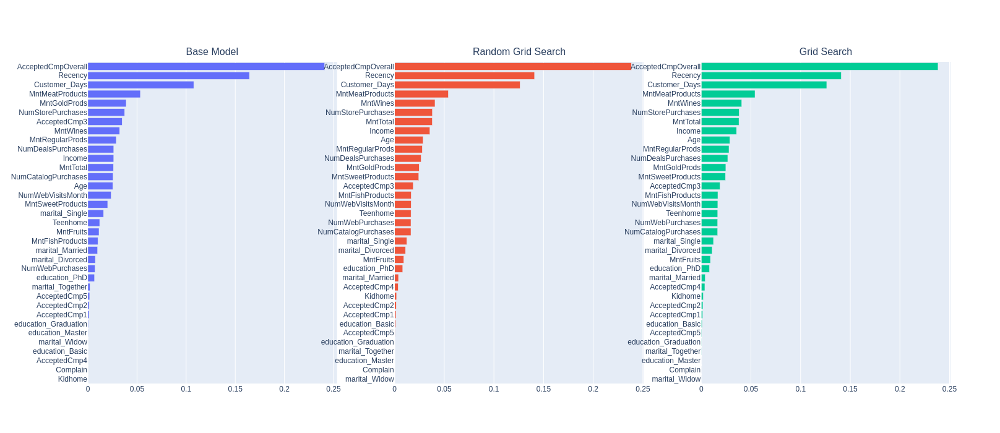

In [78]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Base Model", "Random Grid Search", "Grid Search"))

# Base Model
sorted_idx_base = xgb_base.feature_importances_.argsort()
trace_base = go.Bar(y=X_train.columns[sorted_idx_base], x=xgb_base.feature_importances_[sorted_idx_base], orientation='h', name='Base Model')

# Random Grid Search
sorted_idx_rs = xgb_rs_bestF1.feature_importances_.argsort()
trace_rs = go.Bar(y=X_train.columns[sorted_idx_rs], x=xgb_rs_bestF1.feature_importances_[sorted_idx_rs], orientation='h', name='Random Grid Search')

# Grid Search
sorted_idx_gs = xgb_gs_bestF1.feature_importances_.argsort()
trace_gs = go.Bar(y=X_train.columns[sorted_idx_gs], x=xgb_gs_bestF1.feature_importances_[sorted_idx_gs], orientation='h', name='Grid Search')

fig.add_trace(trace_base, row=1, col=1)
fig.add_trace(trace_rs, row=1, col=2)
fig.add_trace(trace_gs, row=1, col=3)

fig.update_layout(width=1600, height=700, showlegend=False)

fig.show()


<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

- Similar ao Random Forest.

### - Regressão logística

A **Regressão Logística** é um modelo de aprendizado de máquina amplamente utilizado para tarefas de classificação binária. Optamos por não realizar um **Random Grid Search** para otimizar a Regressão Logística, uma vez que o algoritmo é conhecido por sua execução rápida. Em vez disso, para melhorar a eficiência do algoritmo, optaremos por dimensionar as variáveis, uma etapa que pode acelerar o processo de treinamento e melhorar a convergência do modelo.

Para evitar multicolinearidade, vamos descartar algumas variáveis que tem relações diretas com outras, como por exemplo, `MntTotal` e os `AcceptedCmp` individuais, assim como uma variável categórica de `marital` e `education`.

In [79]:

var = ['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Complain',  'Age', 'Customer_Days',
       'marital_Married', 'marital_Single',
       'marital_Together', 'marital_Widow', 
       'education_Graduation', 'education_Master', 'education_PhD', 
       'MntRegularProds', 'AcceptedCmpOverall', 'Response']


df_ = df[var]

X_ = df_.drop(columns='Response')
y_ = df_['Response']

X_train_, X_test_, y_train_, y_test_ = train_test_split(X_, y_, test_size=0.3, stratify=y_, random_state=42)


In [80]:
categorical_columns = X_train_.select_dtypes(include=['category']).columns
X_train_[categorical_columns] = X_train_[categorical_columns].astype(int)
X_test_[categorical_columns] = X_test_[categorical_columns].astype(int)

scaler = MinMaxScaler(feature_range=(0, 1))
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_), columns = X_train_.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test_), columns = X_test_.columns)


#### Modelo base

In [81]:
llm_base, llm_base_metrics = evaluate_model('LogisticRegression', X_train_scaled, y_train_, X_test_scaled, y_test_, params = None)  


Default parameters:
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False} 



In [82]:
llm_base_metrics.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
Train 5-fold,88.81%,50.76%,78.78%,38.02%
Test,90.43%,59.15%,85.71%,45.16%


#### Grid Search

In [83]:
grid_params = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'lbfgs', 'newton-cg'],
    'max_iter': [100, 500, 1000]
}

In [84]:
# # Do not run!!
# llm_ = LogisticRegression()

# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# grid_search_llm = GridSearchCV(
#     llm_,
#     grid_params,
#     cv=cv,
#     verbose = 3,
#     scoring=['accuracy', 'f1', 'precision', 'recall'],
#     refit = 'accuracy',
#     n_jobs = -1
# )

# grid_search_llm.fit(X_train_scaled, y_train_)
# pd.DataFrame(grid_search_llm.cv_results_).to_csv('gridsearch/llm.csv', index = False)

In [85]:
order_by = 'mean_test_f1'
results_file = 'gridsearch/llm.csv'

results = pd.read_csv(results_file)
results = results.sort_values(by = order_by, ascending = False)
results[['params', 'mean_test_accuracy', 'mean_test_f1', 'mean_test_precision', 'mean_test_recall', 'mean_fit_time' ]].head(5)

,params,mean_test_accuracy,mean_test_f1,mean_test_precision,mean_test_recall,mean_fit_time
89,"{'C': 10, 'max_iter': 1000, 'penalty': 'l2', '...",0.887384,0.546736,0.717603,0.444715,0.080222
88,"{'C': 10, 'max_iter': 1000, 'penalty': 'l2', '...",0.887384,0.546736,0.717603,0.444715,0.044534
83,"{'C': 10, 'max_iter': 500, 'penalty': 'l2', 's...",0.887384,0.546736,0.717603,0.444715,0.060055
82,"{'C': 10, 'max_iter': 500, 'penalty': 'l2', 's...",0.887384,0.546736,0.717603,0.444715,0.045863
77,"{'C': 10, 'max_iter': 100, 'penalty': 'l2', 's...",0.887384,0.546736,0.717603,0.444715,0.064871


In [86]:
params_best = results['params'].iloc[0]
params_best = ast.literal_eval(params_best)

llm_gs_bestF1, llm_gs_bestF1_metrics = evaluate_model('LogisticRegression', X_train_scaled, y_train_, X_test_scaled, y_test_, params = params_best)  

llm_gs_bestF1_metrics.style.format('{:.2%}')


Best parameters:
{'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'newton-cg'} 



,Accuracy,F1-score,Precision,Recall
Train 5-fold,88.74%,54.67%,71.76%,44.47%
Test,89.77%,59.74%,75.41%,49.46%


#### Comparação

O modelo de **Regressão Logística** exibiu um desempenho superior quando comparado aos modelos baseados em árvores. Em relação às importâncias das características, a Regressão Logística difere fundamentalmente dos modelos baseados em árvores. Enquanto nas árvores de decisão, a importância das características é calculada com base na contribuição de cada recurso para a redução da impureza nos nós, a Regressão Logística utiliza os coeficientes atribuídos a cada característica no processo de ajuste do modelo. Isso pode resultar em interpretações diferentes das importâncias das características e é importante considerar a natureza do modelo ao avaliar a contribuição de cada característica para a previsão.

In [87]:
models_metrics = [
    llm_base_metrics, llm_gs_bestF1_metrics
]

models_name = [
    'llm_base', 'llm_gs_bestF1'
]


comparison = pd.concat([metric.loc['Test', :].rename(model) for metric, model in zip(models_metrics, models_name)], axis=1).T

In [88]:
comparison = comparison.sort_values(by='F1-score', ascending=False)
comparison.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
llm_gs_bestF1,89.77%,59.74%,75.41%,49.46%
llm_base,90.43%,59.15%,85.71%,45.16%


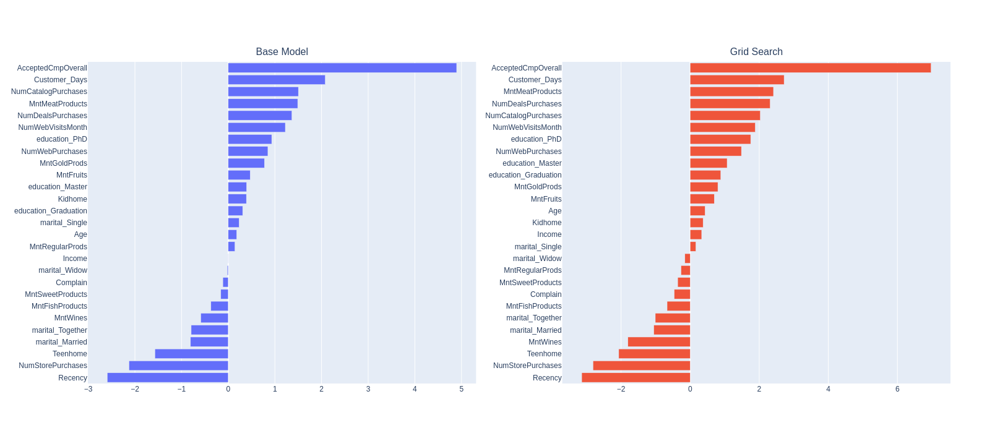

In [89]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Base Model", "Grid Search"))

# Base Model

coefficients_base = llm_base.coef_[0] 
sorted_idx_base = coefficients_base.argsort()
trace_base = go.Bar(y=X_train_.columns[sorted_idx_base], x=coefficients_base[sorted_idx_base], orientation='h', name='Base Model')


# Grid Search
coefficients_gs = llm_gs_bestF1.coef_[0] 
sorted_idx_gs = coefficients_gs.argsort()
trace_gs = go.Bar(y=X_train_.columns[sorted_idx_gs], x=coefficients_gs[sorted_idx_gs], orientation='h', name='Grid Search')

fig.add_trace(trace_base, row=1, col=1)
fig.add_trace(trace_gs, row=1, col=2)


fig.update_layout(width=1600, height=700, showlegend=False)

fig.show()


<div style="font-size: 24px; font-weight: bold;"><u>Insights</u></div>

---

- Aqui conseguimos ver quais variáveis impactam mais em uma predição positiva ou negativa.
- A renda possui relevância pequena para este modelo.

## 3.5. Comparação

Fazendo a comparação geral dos modelos, se destacam os dois modelos de regressão logística como aqueles com maior F1-score. Lembrando que 

$$\text{Lucro por cliente} = 11 \times \text{Precisão} - 3$$

notamos que teremos mais lucro por cliente no segundo modelo. Entretanto, o que nos importa mais é o lucro total da campanha, e isto leva em consideração o lucro por cliente (quantificado pela precisão) e o total de clientes (quantificado pelo recall). O recall de ambos os modelos são muito próximos, e desta forma, buscamos analisar o lucro total da campanha na base de teste. O cálculo do lucro total se baseia na equação

$$
\text{Lucro total}  = 11 \times TP - 3 \times (TP + FP)
$$ 

e assim conseguimos ver que o melhor modelo é o modelo LLM Grid Search com lucro total na base de teste de \\$323 e lucro por cliente de \\$5.30.


In [90]:
models_metrics = [
    rf_base_metrics, rf_rs_bestF1_metrics, rf_gs_bestF1_metrics,
    tree_base_metrics, tree_gs_post_bestF1_metrics, tree_gs_pre_bestF1_metrics, 
    xgb_base_metrics, xgb_rs_bestF1_metrics, xgb_gs_bestF1_metrics,
    llm_base_metrics, llm_gs_bestF1_metrics
]

models_name = [
    'rf_base', 'rf_rs_bestF1', 'rf_gs_bestF1',
    'tree_base', 'tree_gs_post_bestF1', 'tree_gs_pre_bestF1', 
    'xgb_base', 'xgb_rs_bestF1', 'xgb_gs_bestF1',
    'llm_base', 'llm_gs_bestF1'
]


comparison = pd.concat([metric.loc['Test', :].rename(model) for metric, model in zip(models_metrics, models_name)], axis=1).T

In [91]:
comparison = comparison.sort_values(by='F1-score', ascending=False)
comparison.style.format('{:.2%}')

,Accuracy,F1-score,Precision,Recall
llm_gs_bestF1,89.77%,59.74%,75.41%,49.46%
llm_base,90.43%,59.15%,85.71%,45.16%
xgb_rs_bestF1,86.96%,53.25%,59.21%,48.39%
xgb_gs_bestF1,86.47%,51.76%,57.14%,47.31%
xgb_base,87.95%,49.66%,69.23%,38.71%
tree_gs_pre_bestF1,80.36%,40.20%,37.74%,43.01%
tree_gs_post_bestF1,83.33%,39.52%,44.59%,35.48%
tree_base,80.03%,39.20%,36.79%,41.94%
rf_rs_bestF1,85.97%,37.96%,59.09%,27.96%
rf_gs_bestF1,85.81%,37.68%,57.78%,27.96%


In [93]:
models = [
    rf_base, rf_rs_bestF1, rf_gs_bestF1,
    tree_base, tree_gs_post_bestF1, tree_gs_pre_bestF1, 
    xgb_base, xgb_rs_bestF1, xgb_gs_bestF1,
    llm_base, llm_gs_bestF1
]

models_name = [
    'rf_base', 'rf_rs_bestF1', 'rf_gs_bestF1',
    'tree_base', 'tree_gs_post_bestF1', 'tree_gs_pre_bestF1', 
    'xgb_base', 'xgb_rs_bestF1', 'xgb_gs_bestF1',
    'llm_base', 'llm_gs_bestF1'
]


totalprofit_array = []
profitbyclient_array = []
for model in models:
    if model == llm_base or model == llm_gs_bestF1:
        cm = confusion_matrix(y_test, model.predict(X_test_scaled))
    else:
        cm = confusion_matrix(y_test, model.predict(X_test)) 
    tp = cm[1,1]
    fn = cm[0,1]
    totalprofit = (11*tp-(tp + fn)*3)
    profitbyclient = totalprofit/(tp+fn)
    totalprofit_array.append(totalprofit)
    profitbyclient_array.append(profitbyclient)
    
    
pbc_df = pd.DataFrame({'TotalProfit': totalprofit_array, 'ProfitByClient': profitbyclient_array}, index=models_name)

    

In [100]:
result = comparison.join(pbc_df, how='inner')

formatted_result = result.copy()
columns_to_format = list(result.columns)[:-2]  # Todas as colunas, exceto a última
formatted_result[columns_to_format] = formatted_result[columns_to_format].applymap('{:.2%}'.format)
formatted_result['TotalProfit'] = '$' + formatted_result['TotalProfit'].astype(str)
formatted_result[['ProfitByClient']] = formatted_result[['ProfitByClient']].applymap('{:.3}'.format)
formatted_result['ProfitByClient'] = '$' + formatted_result['ProfitByClient'].astype(str)


formatted_result


,Accuracy,F1-score,Precision,Recall,TotalProfit,ProfitByClient
llm_gs_bestF1,89.77%,59.74%,75.41%,49.46%,$323,$5.3
llm_base,90.43%,59.15%,85.71%,45.16%,$315,$6.43
xgb_rs_bestF1,86.96%,53.25%,59.21%,48.39%,$267,$3.51
xgb_gs_bestF1,86.47%,51.76%,57.14%,47.31%,$253,$3.29
xgb_base,87.95%,49.66%,69.23%,38.71%,$240,$4.62
tree_gs_pre_bestF1,80.36%,40.20%,37.74%,43.01%,$122,$1.15
tree_gs_post_bestF1,83.33%,39.52%,44.59%,35.48%,$141,$1.91
tree_base,80.03%,39.20%,36.79%,41.94%,$111,$1.05
rf_rs_bestF1,85.97%,37.96%,59.09%,27.96%,$154,$3.5
rf_gs_bestF1,85.81%,37.68%,57.78%,27.96%,$151,$3.36
